# Install Libraries


In [ ]:
%pip install torch torchvision torchaudio --quiet
%pip install tensorflow --quiet
%pip install plotly --quiet
%pip install --upgrade nbformat --quiet
%pip install --upgrade nbformat --user --quiet
%pip install ipykernel jupyter --quiet
%pip install tensorflow-addons --quiet

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


# Classifer (Simple CNN)

In [2]:
import torch.nn as nn

# Define the CNN model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10):  # 10 classes for MNIST digits (0-9)
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # Input channels = 1 for grayscale
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * 7 * 7, 128)  # Adjusted input size for fc1 (7x7 after pooling)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool1(self.relu1(self.conv1(x)))
        x = self.pool2(self.relu2(self.conv2(x)))
        x = self.flatten(x)
        x = self.relu3(self.fc1(x))
        x = self.fc2(x)
        return x

# Preprocess 5 Train - test dataset

In [ ]:
import torch
from torchvision import datasets, transforms
from collections import Counter
from sklearn.model_selection import KFold
import numpy as np
from sklearn.model_selection import StratifiedKFold
from collections import Counter
import random
# get imbalanced
def get_class_imabalnced(dataset, ratio):
  imbalanced_dataset = []
  for label in range(10):
    count = ratio[label]
    current_count = 0
    for data, target in dataset:
      if target == label and current_count < count:
        imbalanced_dataset.append((data, target))
        current_count += 1
  return imbalanced_dataset

def get_class_imabalnced2(dataset, ratio):
    imbalanced_dataset = []
    for label in range(10):
        count = ratio[label]
        current_count = 0

        # Shuffle data within the class:
        class_data = [(data, target) for data, target in dataset if target == label]
        random.shuffle(class_data)

        selected_indices = set()  # Keep track of selected indices

        for i, (data, target) in enumerate(class_data):  # Use enumerate
            if target == label and current_count < count and i not in selected_indices:
                imbalanced_dataset.append((data, target))
                current_count += 1
                selected_indices.add(i)
    return imbalanced_dataset

# Load dataset
mnist_dataset = datasets.CIFAR10(
  root="./data", 
  train=True, 
  download=True, 
  transform=transforms.Compose([
    transforms.Resize((28, 28)), 
    transforms.ToTensor()
])
)

# Prepare data for k-fold cross-validation
X = [data for data, _ in mnist_dataset]
y = [target for _, target in mnist_dataset]

# Initialize k-fold cross-validation
num_folds = 5
batch_size = 100

# Assuming 'y' is your target variable containing class labels
min_samples_per_class = min(Counter(y).values())
max_desired_count = min_samples_per_class // num_folds  # Dividing by 5 for 5-fold cross-validation

print(f"Minimum samples per class: {min_samples_per_class}")
print(f"Maximum allowed desired_count: {max_desired_count}")

# Create an imbalanced dataset
train_counts = {
  0: 3000,
  1: 2000,
  2: 1000,
  3: 750,
  4: 500,
  5: 12,
  6: 10,
  7: 8,
  8: 6,
  9: 4,
}

test_counts = {
    0: max_desired_count,
    1: max_desired_count,
    2: max_desired_count,
    3: max_desired_count,
    4: max_desired_count,
    5: max_desired_count,
    6: max_desired_count,
    7: max_desired_count,
    8: max_desired_count,
    9: max_desired_count,
}

imbalanced_train_dataset_list = []

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)
# Iterate over folds
folds_data = []
for fold, (train_index, test_index) in enumerate(kf.split(X,y)):
    print(f"Fold {fold + 1}")

    # Get the training data for this fold
    train_dataset_fold = [(X[i], y[i]) for i in train_index]

    # Apply the get_class_imabalnced function to enforce the desired distribution
    train_dataset = get_class_imabalnced2(train_dataset_fold, train_counts)

    imbalanced_train_dataset_list.append(train_dataset)

    # Create test dataset for this fold
    test_dataset_fold = [(X[i], y[i]) for i in test_index]
    test_dataset = get_class_imabalnced2(test_dataset_fold, test_counts)

    # Create datasets and dataloaders for this fold
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size , shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size , shuffle=True)

    folds_data.append([train_loader, test_loader])

    # Print class distribution for this fold
    class_counts_train = Counter([label for _, label in train_dataset])
    class_counts_test = Counter([label for _, label in test_dataset])
    print("Class distribution in Train dataset:", class_counts_train)
    print("Class distribution in Test dataset:", class_counts_test)

100%|██████████| 170M/170M [00:12<00:00, 13.7MB/s] 


Minimum samples per class: 5000
Maximum allowed desired_count: 1000
Fold 1
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})
Fold 2
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})
Fold 3
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})
Fold 4
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class di

In [4]:
for w in folds_data[0][0]:
    print(w[0][0].shape)
    break

torch.Size([3, 28, 28])


In [ ]:
# save rawdata
import numpy as np
pathsave = '/home/s2522002/source_code/rawdata/train_test.npy'
np.save(pathsave,folds_data)

In [6]:
rank_acc,rank_pre,rank_rec,rank_f1 = [],[],[],[]

# CNN Imb Train-Test

In [7]:
# Create model, optimizer, and loss function
#check gpu
import torch.optim as optim
import torch.nn as nn
import statistics

from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#set hyperparameter

num_epochs = 5
LR = 0.01
model = SimpleCNN().to(device) #ResNetMNIST().to(device)#SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.0, weight_decay=5e-4)

avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
cm_list = []
acsa_list = []

# Training loop
for datatset in folds_data:
    imbalanced_train_loader = datatset[0]
    for epoch in tqdm(range(num_epochs),desc='Loading...'):
        for batch_idx, (data, target) in enumerate(imbalanced_train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()

            output = model(data)

            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

    print("Training finished!")

    # measure ACSA, GM, and FM from imbalanced_test_loader
    import numpy as np
    from sklearn.metrics import confusion_matrix

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode

    imbalanced_test_loader = datatset[1]
    true_labels = []
    predicted_labels = []

    with torch.no_grad():
        for data, target in imbalanced_test_loader:
            data = data.to(device)
            target = target.to(device)

            output = model(data)
            _, predicted = torch.max(output.data, 1)

            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())

    cm = confusion_matrix(true_labels, predicted_labels)
    cm_list.append(cm)

    ########################## Test ############################################
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []

    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn

      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0

      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)

    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)

    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0

    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2

    ## Keep ALL values to list
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))

print(cm_list)

Loading...: 100%|██████████| 5/5 [00:13<00:00,  2.80s/it]


Training finished!
[np.float64(0.8238800000000002)]


Loading...: 100%|██████████| 5/5 [00:14<00:00,  2.85s/it]


Training finished!
[np.float64(0.8238800000000002), np.float64(0.83374)]


Loading...: 100%|██████████| 5/5 [00:13<00:00,  2.72s/it]


Training finished!
[np.float64(0.8238800000000002), np.float64(0.83374), np.float64(0.8401400000000001)]


Loading...: 100%|██████████| 5/5 [00:14<00:00,  2.81s/it]


Training finished!
[np.float64(0.8238800000000002), np.float64(0.83374), np.float64(0.8401400000000001), np.float64(0.84314)]


Loading...: 100%|██████████| 5/5 [00:14<00:00,  2.81s/it]


Training finished!
[np.float64(0.8238800000000002), np.float64(0.83374), np.float64(0.8401400000000001), np.float64(0.84314), np.float64(0.8440200000000001)]
Average Accuracy: 0.8369840000000001
Average Sensitivity: 0.18492
Average Specificity: 0.9094355555555556
Average Precision: 0.08460510344532646

G-mean: 0.407848679158738
F-measure: 0.11424160850866508

ACSA: 0.5109520000000001
[array([[925,  73,   2,   0,   0,   0,   0,   0,   0,   0],
       [739, 253,   8,   0,   0,   0,   0,   0,   0,   0],
       [807, 177,  16,   0,   0,   0,   0,   0,   0,   0],
       [775, 190,  35,   0,   0,   0,   0,   0,   0,   0],
       [783, 176,  41,   0,   0,   0,   0,   0,   0,   0],
       [784, 182,  34,   0,   0,   0,   0,   0,   0,   0],
       [589, 380,  31,   0,   0,   0,   0,   0,   0,   0],
       [837, 150,  13,   0,   0,   0,   0,   0,   0,   0],
       [947,  47,   6,   0,   0,   0,   0,   0,   0,   0],
       [899,  97,   4,   0,   0,   0,   0,   0,   0,   0]]), array([[838, 140,  1

In [8]:
rank_acc.append(avg_accuracy_list)
rank_pre.append(avg_precision_list)
rank_rec.append(avg_sensitivity_list)
rank_f1.append(f_measure_list)

# DeepCLSMOTE 

## Architecture

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import torch.nn.functional as F

print(torch.version.cuda) 
t3 = time.time()
##############################################################################
"""args for AE"""

args = {}
args['dim_h'] = 64          # factor controlling size of hidden layers
args['n_channel'] = 3       # number of channels in the input data
args['n_z'] = 300           # number of dimensions in latent space.
args['sigma'] = 1.0         # variance in n_z
args['lambda'] = 0.01       # hyper param for weight of discriminator loss
args['lr'] = 0.0002         # learning rate for Adam optimizer .000
#args['epochs'] = 10        # how many epochs to run for (original used 200)
args['batch_size'] = 100    # batch size for SGD
args['save'] = True         # save weights at each epoch of training if True
args['train'] = True        # train networks if True, else load networks from
args['dataset'] = 'mnist'   #'fmnist' # specify which dataset to use
args['num_class'] = 10

##############################################################################



## create encoder model and decoder model
class Encoder(nn.Module):
    def __init__(self, args):
        super(Encoder, self).__init__()

        self.n_channel = args['n_channel']
        self.dim_h = args['dim_h']
        self.n_z = args['n_z']

        # convolutional filters, work excellent with image data
        self.conv = nn.Sequential(
            nn.Conv2d(self.n_channel, self.dim_h, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h, self.dim_h * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h * 2, self.dim_h * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h * 4, self.dim_h * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 8), 
            nn.LeakyReLU(0.2, inplace=True) )

        # final layer is fully connected
        self.fc = nn.Linear(self.dim_h * (2 ** 3), self.n_z)
        
    def forward(self, x, labsn):

        x = self.conv(x)

        # Class images Bagging
        train_list = [[] for _ in range(args['num_class'])]
        list_class_latent = [[] for _ in range(args['num_class'])]
        for i, label in enumerate(labsn):
          train_list[label].append(torch.tensor(x[i].cpu().detach().numpy()))
        
        #print(labsn)
        # For each class, we will get the latent representation
        for i, label in enumerate(labsn):
          class_sample = torch.stack(train_list[label])
          class_sample =  class_sample.squeeze().to(device) # Move x0 to the same device as self.fc
          class_sample_linear = self.fc(class_sample)
          
          if len(class_sample_linear.shape) == 1:
              class_sample_linear = class_sample_linear.unsqueeze(0)
          list_class_latent[label] = class_sample_linear

        # Mixed Class (For main reconstruction loss)
        x = x.squeeze()
        x = self.fc(x)

        #sys.exit(1)
        return x, list_class_latent


class Decoder(nn.Module):
    def __init__(self, args):
        super(Decoder, self).__init__()

        self.n_channel = args['n_channel']
        self.dim_h = args['dim_h']
        self.n_z = args['n_z']

        # first layer is fully connected
        self.fc = nn.Sequential(
            nn.Linear(self.n_z, self.dim_h * 8 * 7 * 7),
            nn.ReLU())

        # deconvolutional filters, essentially inverse of convolutional filters
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(self.dim_h * 8, self.dim_h * 4, 4),
            nn.BatchNorm2d(self.dim_h * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.dim_h * 4, self.dim_h * 2, 4),
            nn.BatchNorm2d(self.dim_h * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.dim_h * 2, args['n_channel'], 4, stride=2),
            nn.Tanh())

    def forward(self, x):
        x = self.fc(x)
        x = x.view(-1, self.dim_h * 8, 7, 7)
        x = self.deconv(x)
        return x

##############################################################################
"""set models, loss functions"""
# control which parameters are frozen / free for optimization
def free_params(module: nn.Module):
    for p in module.parameters():
        p.requires_grad = True

def frozen_params(module: nn.Module):
    for p in module.parameters():
        p.requires_grad = False

##############################################################################
"""functions to create SMOTE images"""

def biased_get_class1(c,data,target):

    xbeg = data[target == c]  # Filter data based on target value
    ybeg = target[target == c]  # Filter target based on target value

    return xbeg ,ybeg

def Generate_SMOTE(X, y,n_to_sample,cl):
    # fitting the model
    n_neigh = min(5 + 1,len(X))
    nn = NearestNeighbors(n_neighbors=n_neigh, n_jobs=1)
    nn.fit(X)
    dist, ind = nn.kneighbors(X)

    # generating samples
    base_indices = np.random.choice(list(range(len(X))),n_to_sample)
    neighbor_indices = np.random.choice(list(range(1, n_neigh)),n_to_sample)

    X_base = X[base_indices]
    X_neighbor = X[ind[base_indices, neighbor_indices]]
    samples = X_base + np.multiply(np.random.rand(n_to_sample,1),
            X_neighbor - X_base)


    #use 10 as label because 0 to 9 real classes and 1 fake/smoted = 10
    return samples, [cl]*n_to_sample

###############################################################################


None


## Contrastive Loss

In [ ]:
def calculate_diffs(z):
    """
    Calculate the differences between elements in the input list 'z'
    and return the total sum of all differences for each original element.

    Args:
        z (list): A list of lists containing numerical values.

    Returns:
        list: A list containing the total sum of differences for each original element in 'z'.
    """
    all_diffs_list = []  # List to store lists of differences
    for i, arr1 in enumerate(z):
        diffs_for_arr1 = []  # Store differences for this arr1
        for j, arr2 in enumerate(z):
            if i != j:  # Skip comparing with itself
                diffs = []  # Store diffs for this pair of arr1, arr2
                for el1 in arr1:
                    # Calculate the sum of Euclidean distances between el1 and all elements in arr2
                    diff_for_el1 = sum(np.linalg.norm(np.array([el1.cpu().detach().numpy()]) - np.array([el2.cpu().detach().numpy()])) for el2 in arr2)
                    diffs.append(diff_for_el1)  # Append diff for el1 to diffs
                diffs_for_arr1.append(diffs)  # Append the diffs list for the current arr2
        all_diffs_list.append(diffs_for_arr1)  # Append the diffs_for_arr1

    # Sum all elements within each array to get a single total sum
    total_sums = [sum(sum(inner_list) for inner_list in outer_list) for outer_list in all_diffs_list]

    return total_sums


In [10]:
class NTXentLoss(nn.Module):
    def __init__(self, temperature=0.5):
        super().__init__()
        self.temperature = temperature

    def forward(self, z_i, z_j):
        z = torch.cat([z_i, z_j], dim=0)
        z = F.normalize(z, dim=1)

        similarity = torch.matmul(z, z.T)
        N = z_i.shape[0]

        mask = (~torch.eye(2*N, dtype=bool)).to(z.device)
        sim = similarity / self.temperature
        exp_sim = torch.exp(sim) * mask

        positive_sim = torch.exp(F.cosine_similarity(z_i, z_j) / self.temperature)
        positives = torch.cat([positive_sim, positive_sim], dim=0)

        denominator = exp_sim.sum(dim=1)
        loss = -torch.log(positives / denominator)
        return loss.mean()

In [12]:
"""
Author: Yonglong Tian (yonglong@mit.edu)
Date: May 07, 2020
"""
from __future__ import print_function

import torch
import torch.nn as nn


class SupConLoss(nn.Module):
    """Supervised Contrastive Learning: https://arxiv.org/pdf/2004.11362.pdf.
    It also supports the unsupervised contrastive loss in SimCLR"""
    def __init__(self, contrast_mode='all',
                 base_temperature=0.15):
        super(SupConLoss, self).__init__()
        #self.temperature = temperature
        self.contrast_mode = contrast_mode
        self.base_temperature = base_temperature

    def forward(self, features, temperature, labels=None, mask=None):
        """Compute loss for model. If both `labels` and `mask` are None,
        it degenerates to SimCLR unsupervised loss:
        https://arxiv.org/pdf/2002.05709.pdf

        Args:
            features: hidden vector of shape [bsz, n_views, ...].
            labels: ground truth of shape [bsz].
            mask: contrastive mask of shape [bsz, bsz], mask_{i,j}=1 if sample j
                has the same class as sample i. Can be asymmetric.
        Returns:
            A loss scalar.
        """
        self.temperature = temperature
        
        device = (torch.device('cuda')
                  if features.is_cuda
                  else torch.device('cpu'))

        if len(features.shape) < 3:
            raise ValueError('`features` needs to be [bsz, n_views, ...],'
                             'at least 3 dimensions are required')
        if len(features.shape) > 3:
            features = features.view(features.shape[0], features.shape[1], -1)

        batch_size = features.shape[0]
        if labels is not None and mask is not None:
            raise ValueError('Cannot define both `labels` and `mask`')
        elif labels is None and mask is None:
            mask = torch.eye(batch_size, dtype=torch.float32).to(device)
        elif labels is not None:
            labels = labels.contiguous().view(-1, 1)
            if labels.shape[0] != batch_size:
                raise ValueError('Num of labels does not match num of features')
            mask = torch.eq(labels, labels.T).float().to(device)
        else:
            mask = mask.float().to(device)

        contrast_count = features.shape[1]
        contrast_feature = torch.cat(torch.unbind(features, dim=1), dim=0)
        if self.contrast_mode == 'one':
            anchor_feature = features[:, 0]
            anchor_count = 1
        elif self.contrast_mode == 'all':
            anchor_feature = contrast_feature
            anchor_count = contrast_count
        else:
            raise ValueError('Unknown mode: {}'.format(self.contrast_mode))

        # compute logits
        anchor_dot_contrast = torch.div(
            torch.matmul(anchor_feature, contrast_feature.T),
            self.temperature)
        # for numerical stability
        logits_max, _ = torch.max(anchor_dot_contrast, dim=1, keepdim=True)
        logits = anchor_dot_contrast - logits_max.detach()

        # tile mask
        mask = mask.repeat(anchor_count, contrast_count)
        # mask-out self-contrast cases
        logits_mask = torch.scatter(
            torch.ones_like(mask),
            1,
            torch.arange(batch_size * anchor_count).view(-1, 1).to(device),
            0
        )
        mask = mask * logits_mask

        # compute log_prob
        exp_logits = torch.exp(logits) * logits_mask
        log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True))

        # compute mean of log-likelihood over positive
        # modified to handle edge cases when there is no positive pair
        # for an anchor point. 
        # Edge case e.g.:- 
        # features of shape: [4,1,...]
        # labels:            [0,1,1,2]
        # loss before mean:  [nan, ..., ..., nan] 
        mask_pos_pairs = mask.sum(1)
        mask_pos_pairs = torch.where(mask_pos_pairs < 1e-6, 1, mask_pos_pairs)
        mean_log_prob_pos = (mask * log_prob).sum(1) / mask_pos_pairs

        # loss
        loss = - (self.temperature / self.base_temperature) * mean_log_prob_pos
        loss = loss.view(anchor_count, batch_size).mean()

        return loss

## Traning - Gen - Evalution (SubCon)


Start...
cpu


Loading...: 100%|██████████| 73/73 [01:31<00:00,  1.25s/it]


Epoch 0: MSE: 0.1081, Contrastive: 3.1058, Combined: 1.6070
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 1.52
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


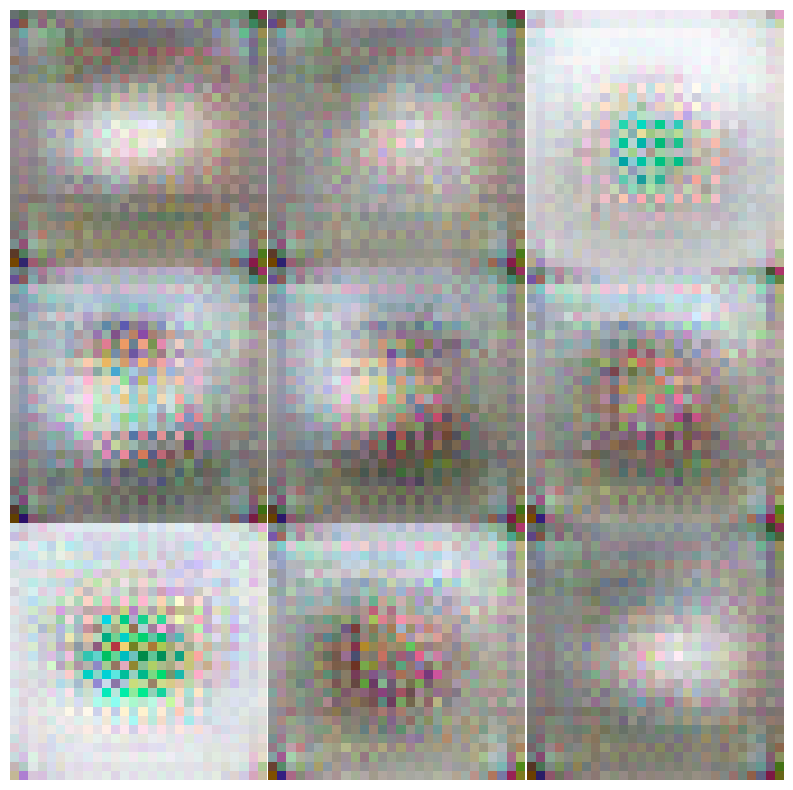

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


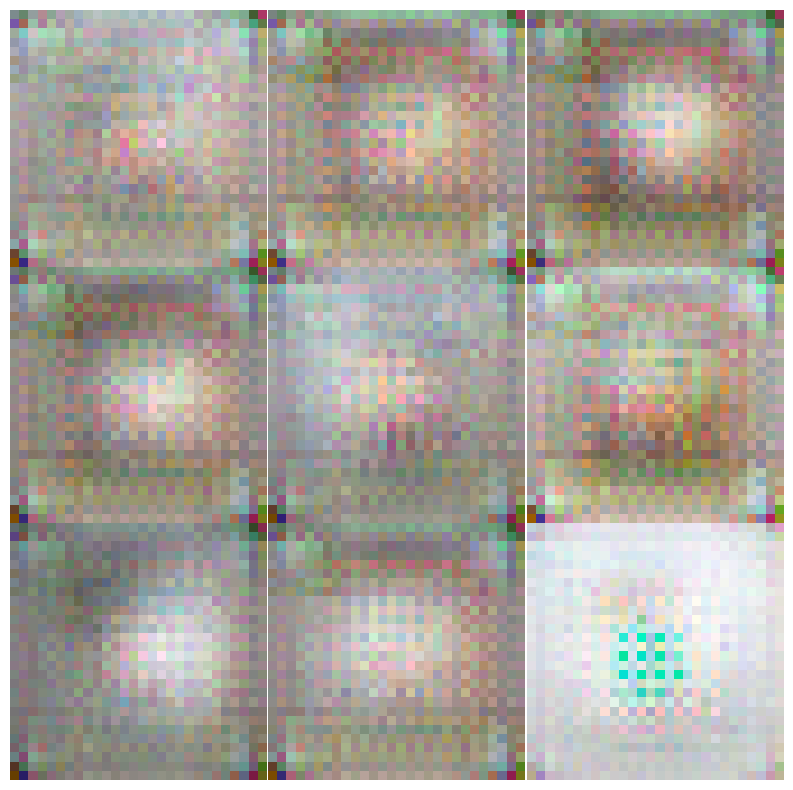

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


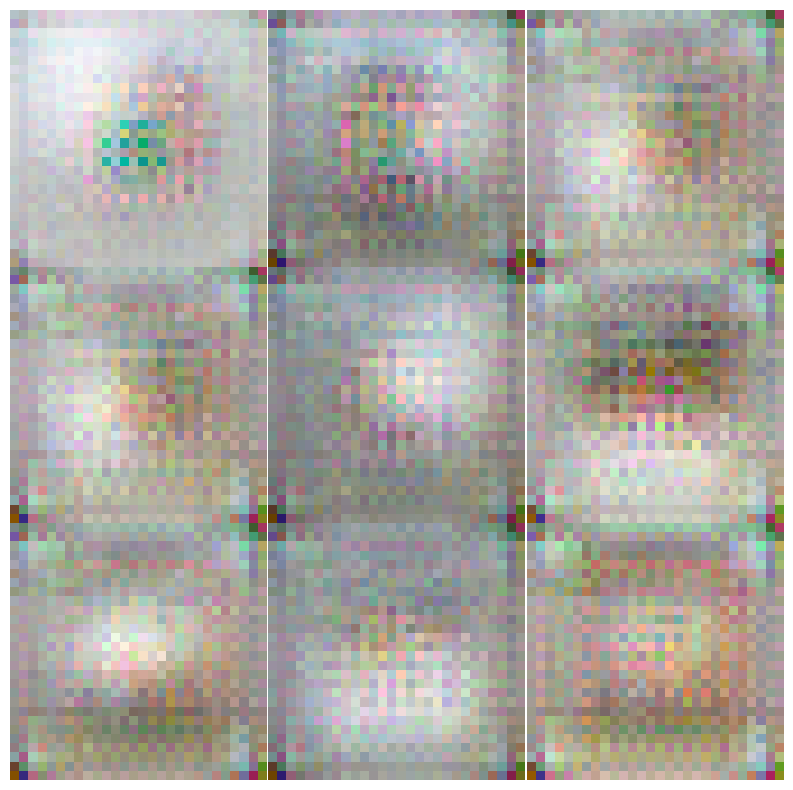

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


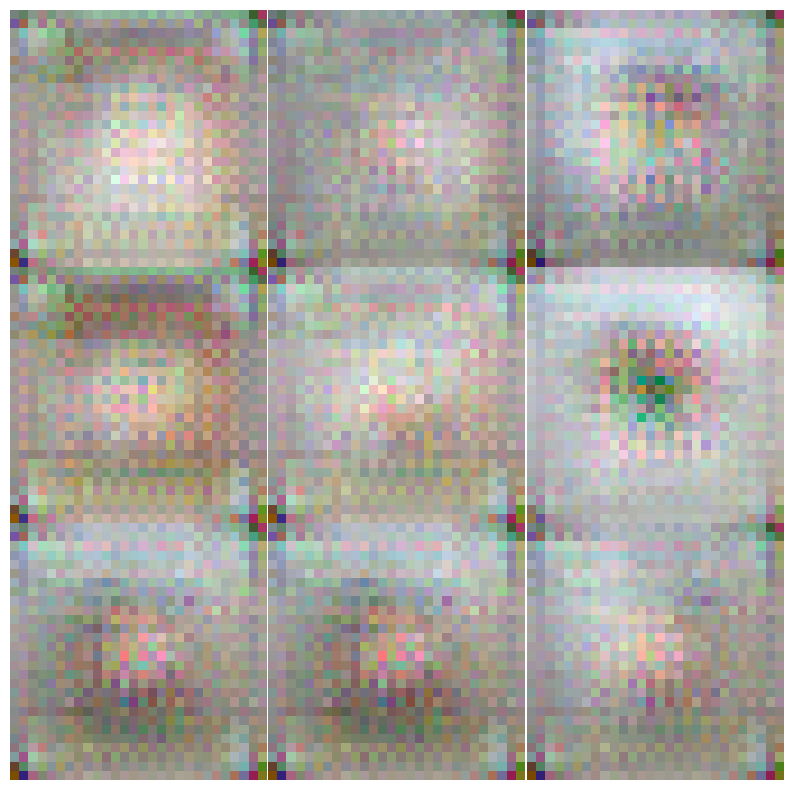

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


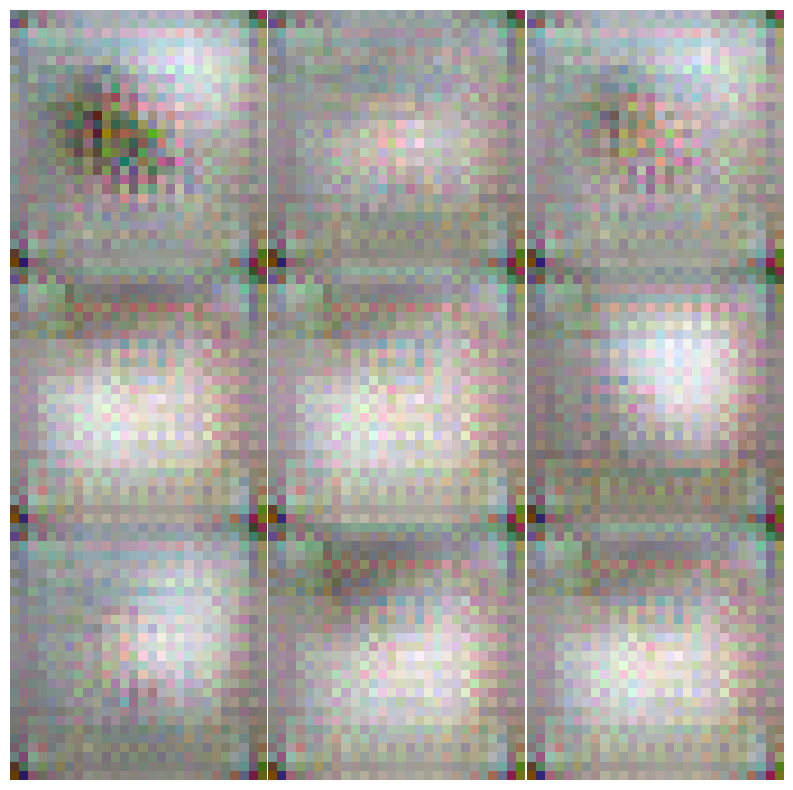

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


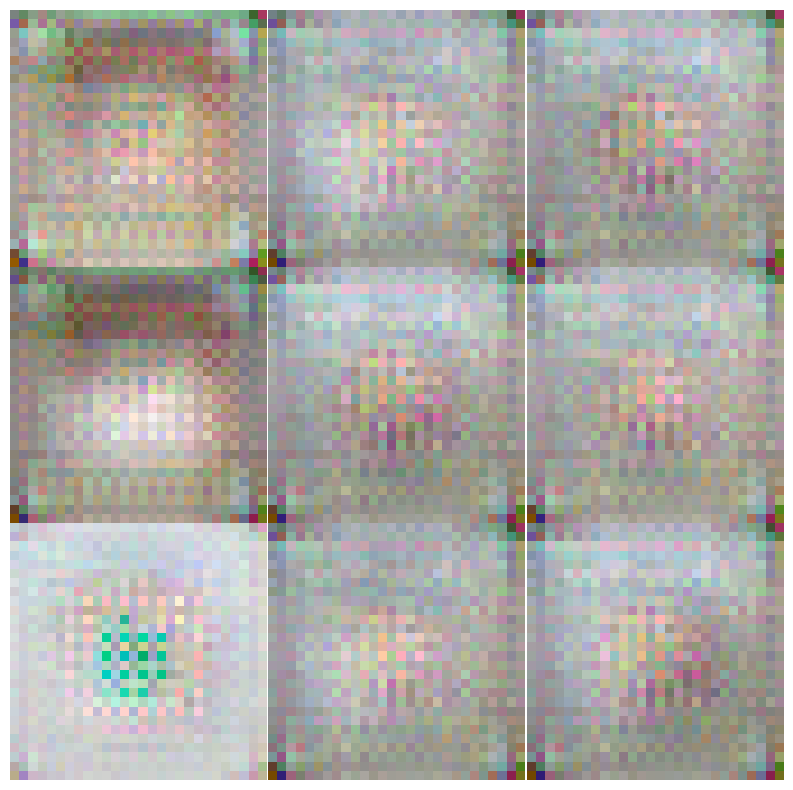

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


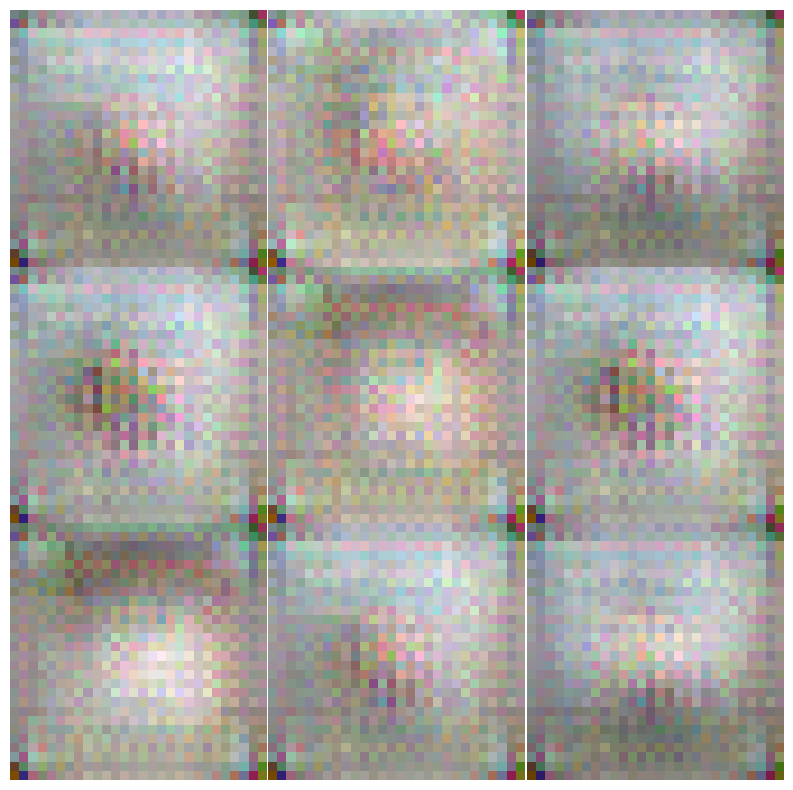

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


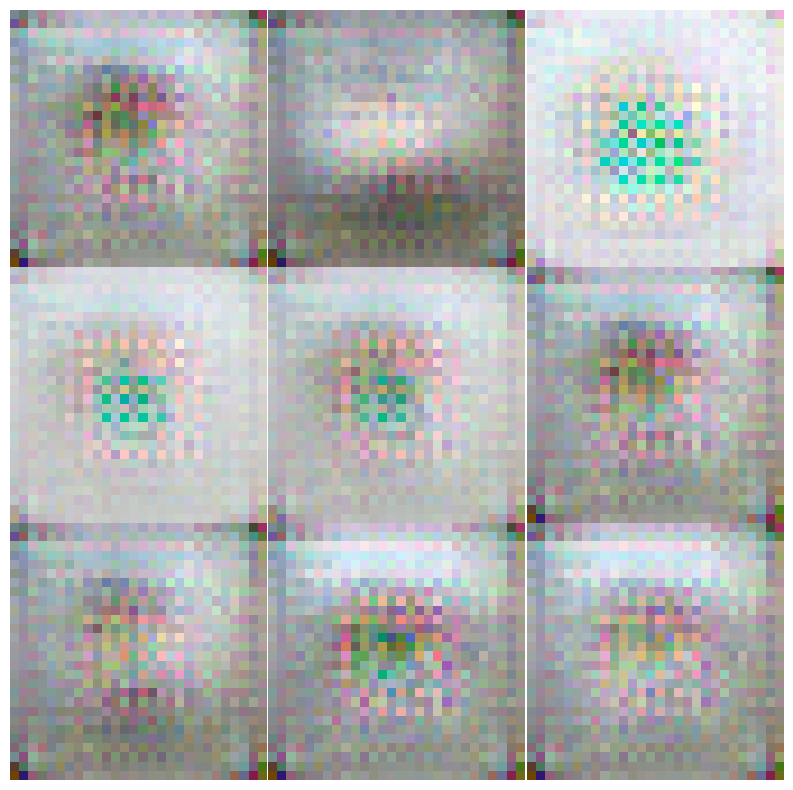

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


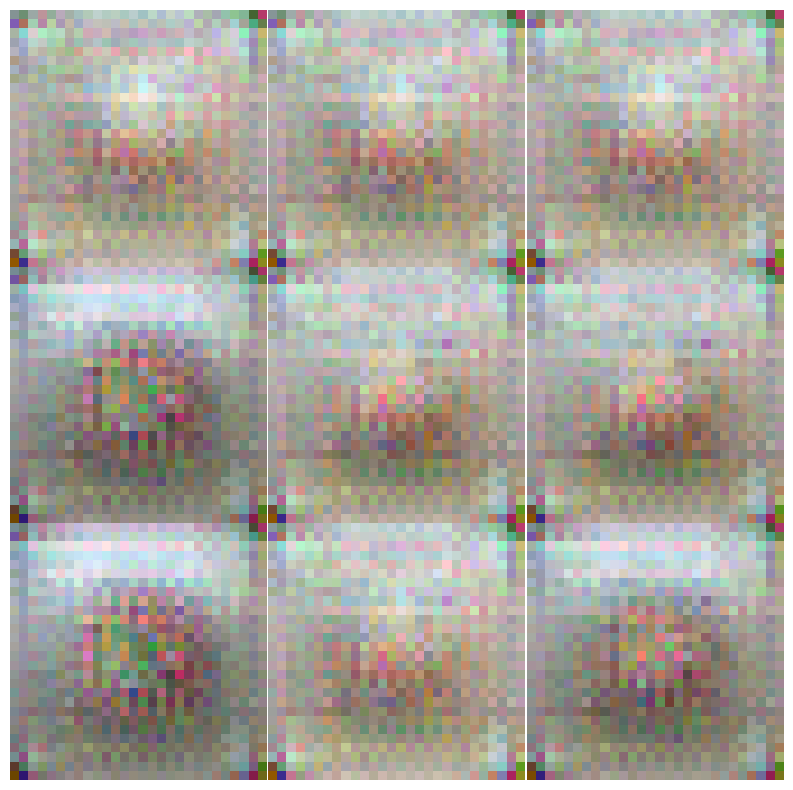

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.89
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.297383
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.298829
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.300110
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.283831
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.284202
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.274364
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.276407
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.257176
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.226151
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.243732
Train Epoch: 1 [11000/30000 (37%)]	Loss: 2.213567
Train Epoch: 1 [12000/30000 (40%)]	Loss: 2.163981
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.156827
Trai

Loading...: 100%|██████████| 73/73 [01:46<00:00,  1.46s/it]


Epoch 0: MSE: 0.1259, Contrastive: 3.3932, Combined: 1.7595
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 1.78
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


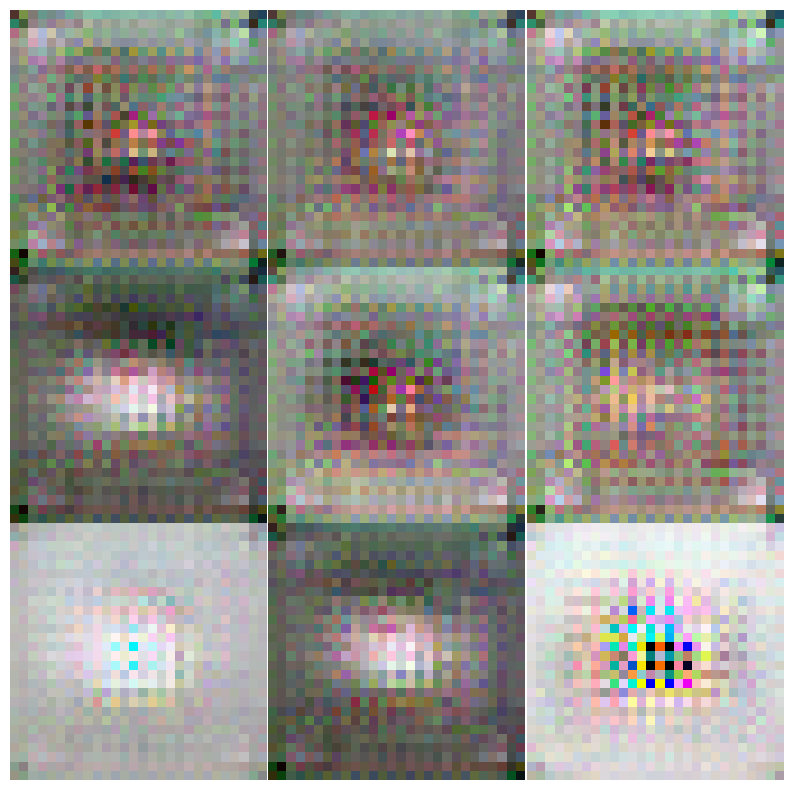

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


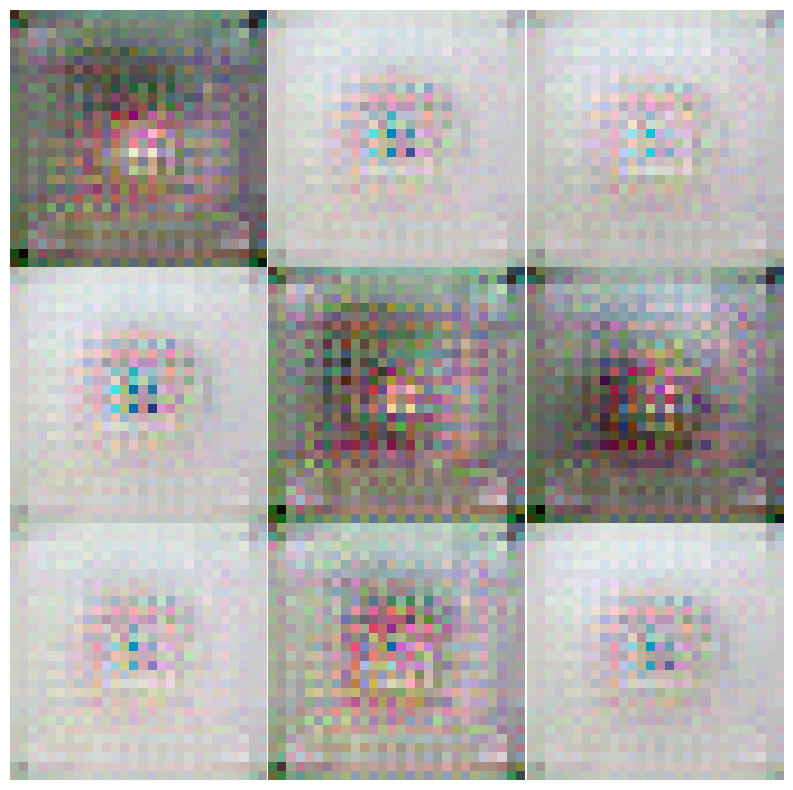

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


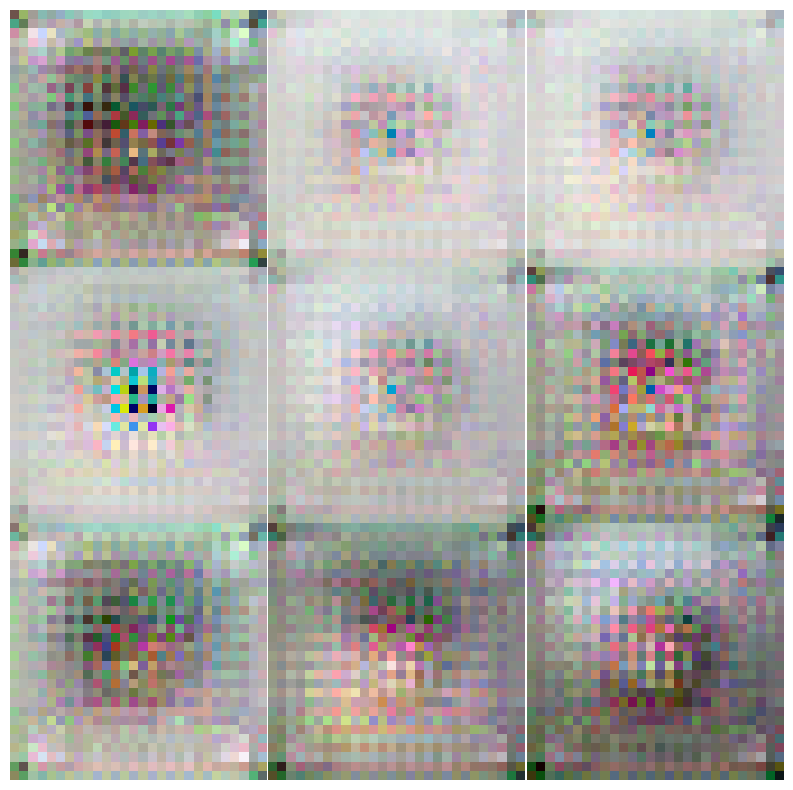

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


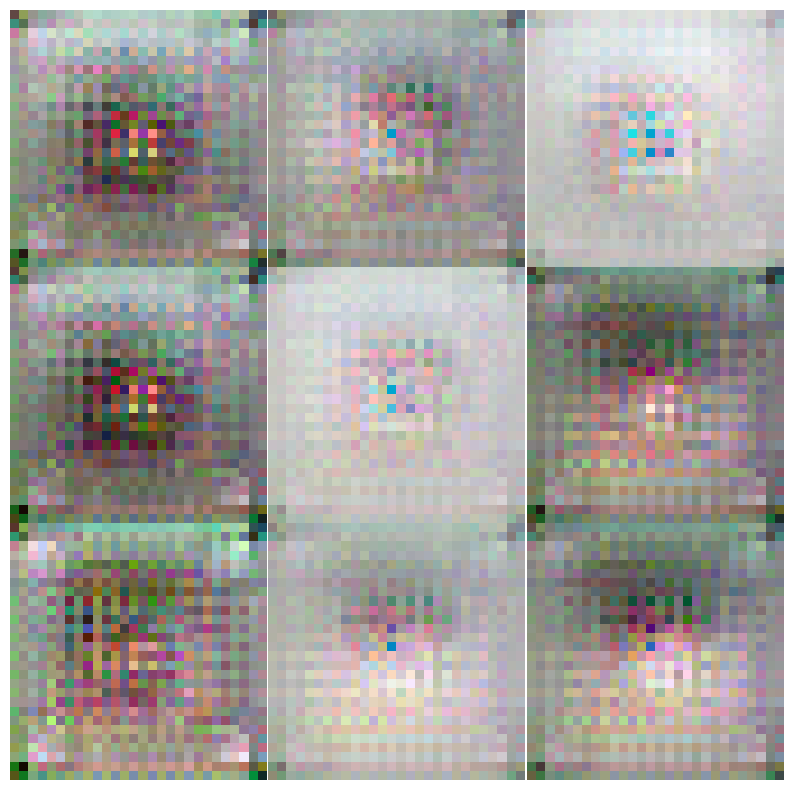

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


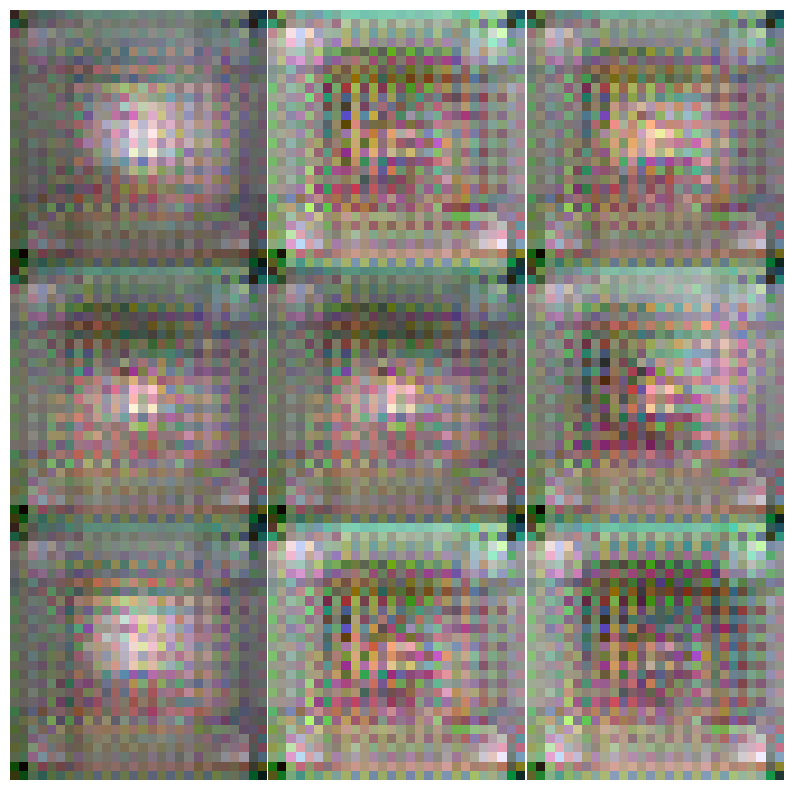

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


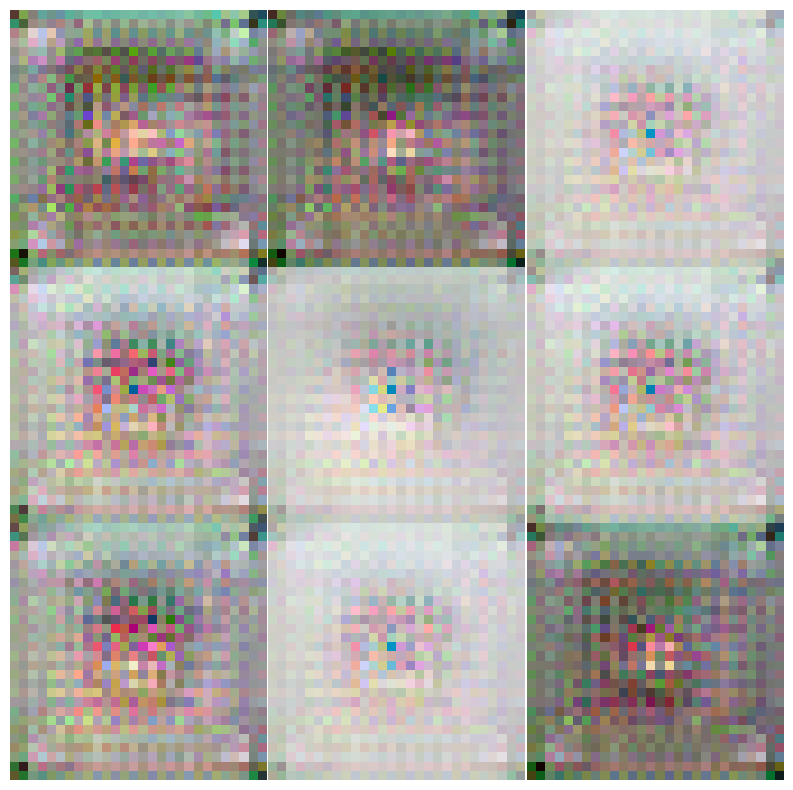

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


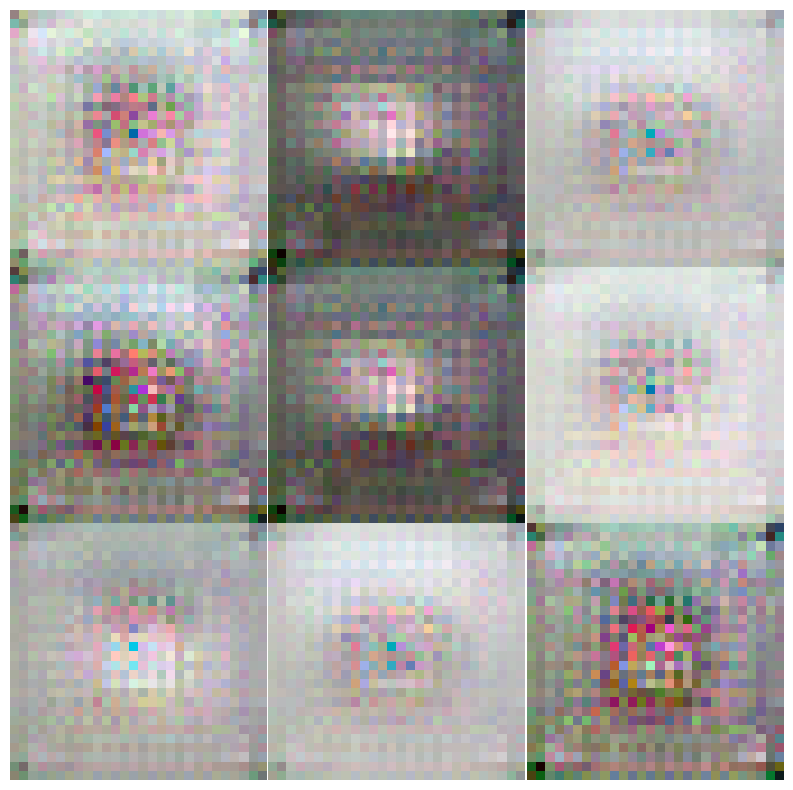

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


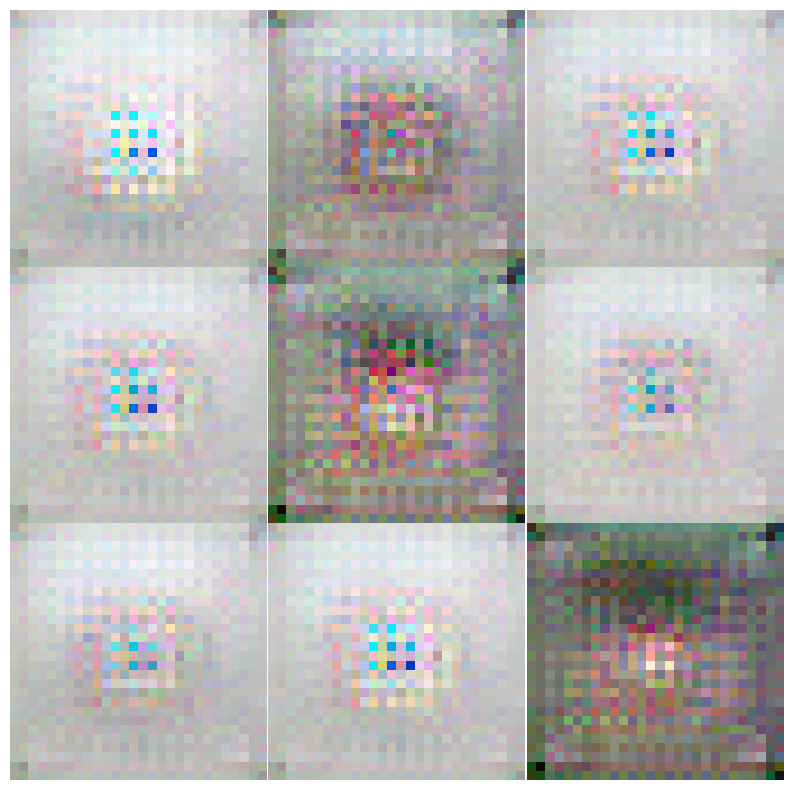

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


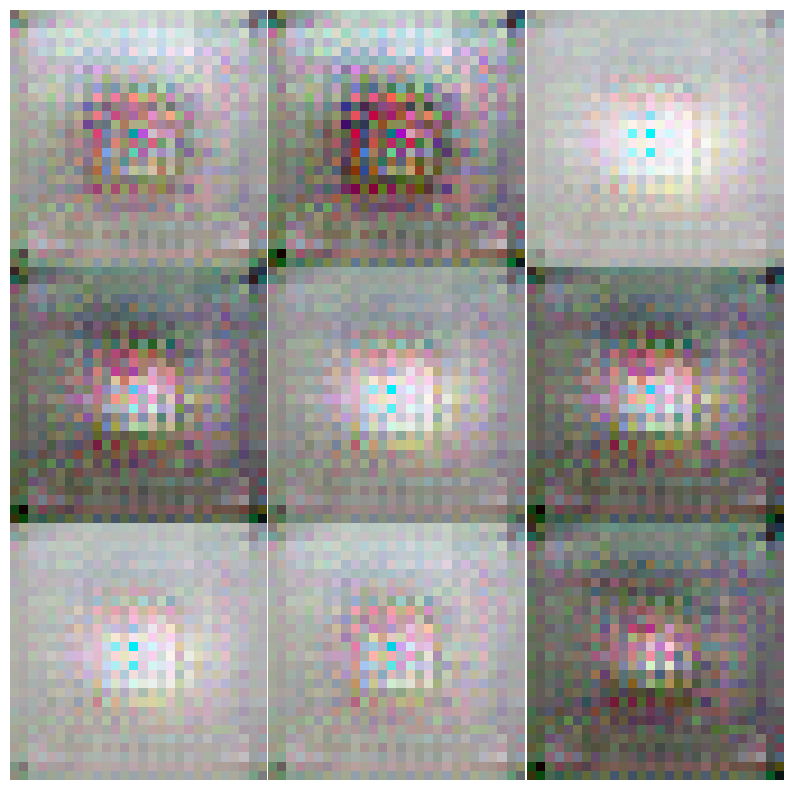

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 1.45
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.306074
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.295010
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.286503
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.296689
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.293864
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.262214
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.276601
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.231202
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.223319
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.200217
Train Epoch: 1 [11000/30000 (37%)]	Loss: 2.068380
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.988597
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.057041
Trai

Loading...: 100%|██████████| 73/73 [01:25<00:00,  1.18s/it]


Epoch 0: MSE: 0.1173, Contrastive: 3.2814, Combined: 1.6994
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 1.43
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


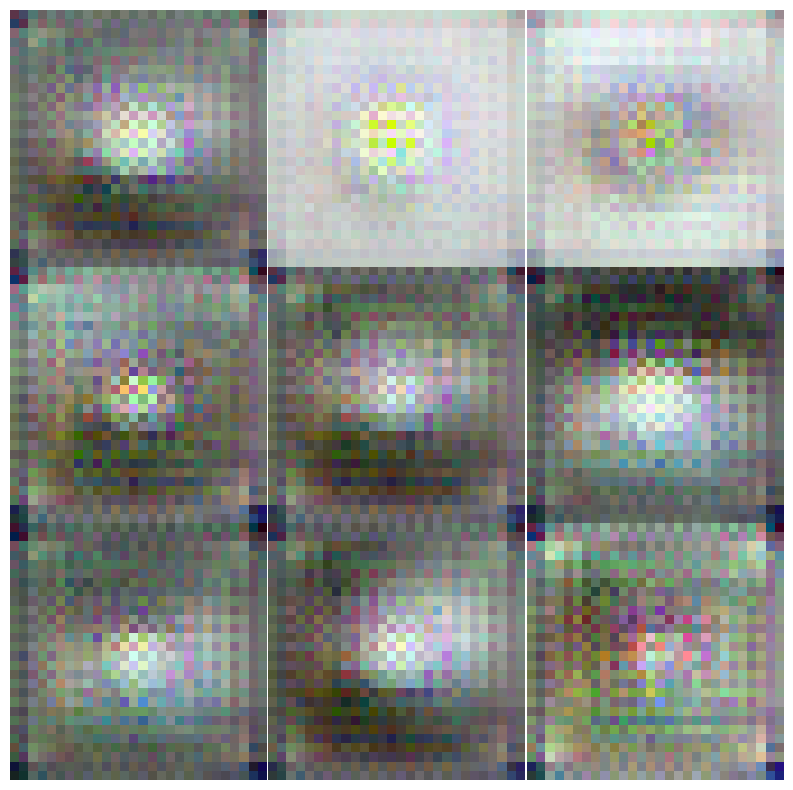

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


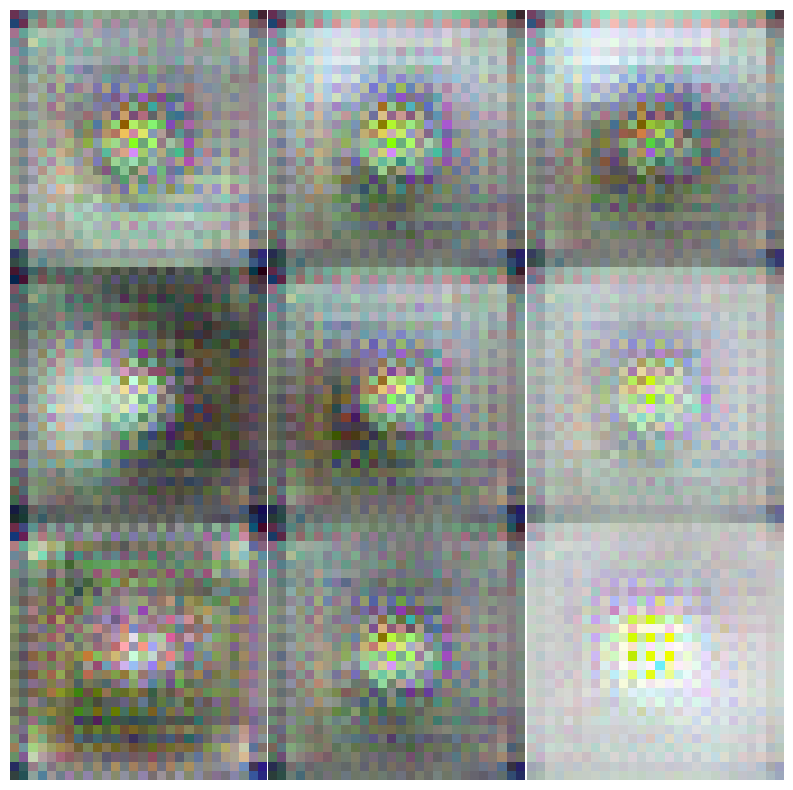

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


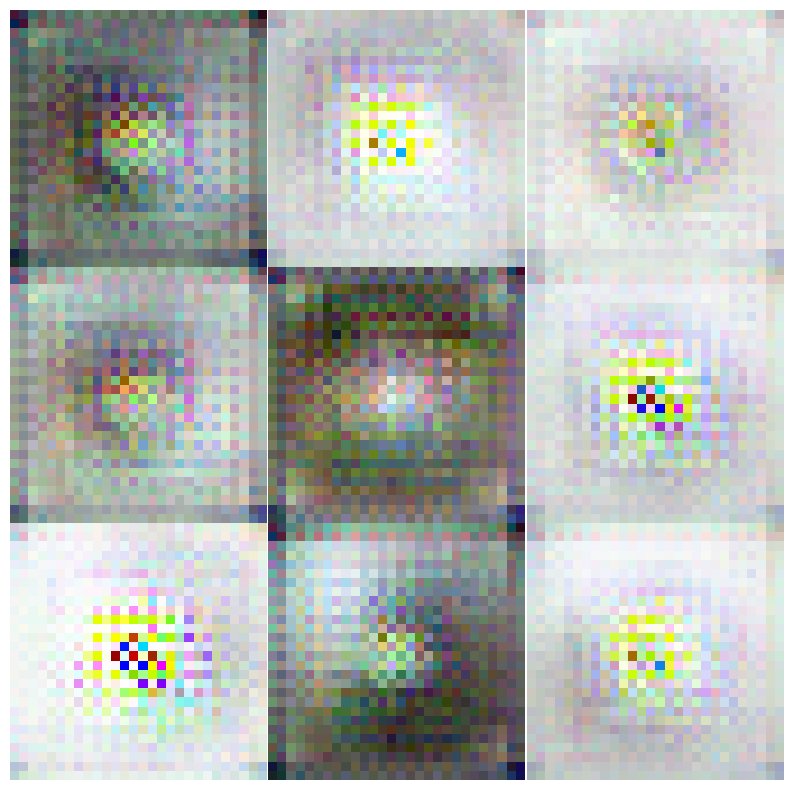

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


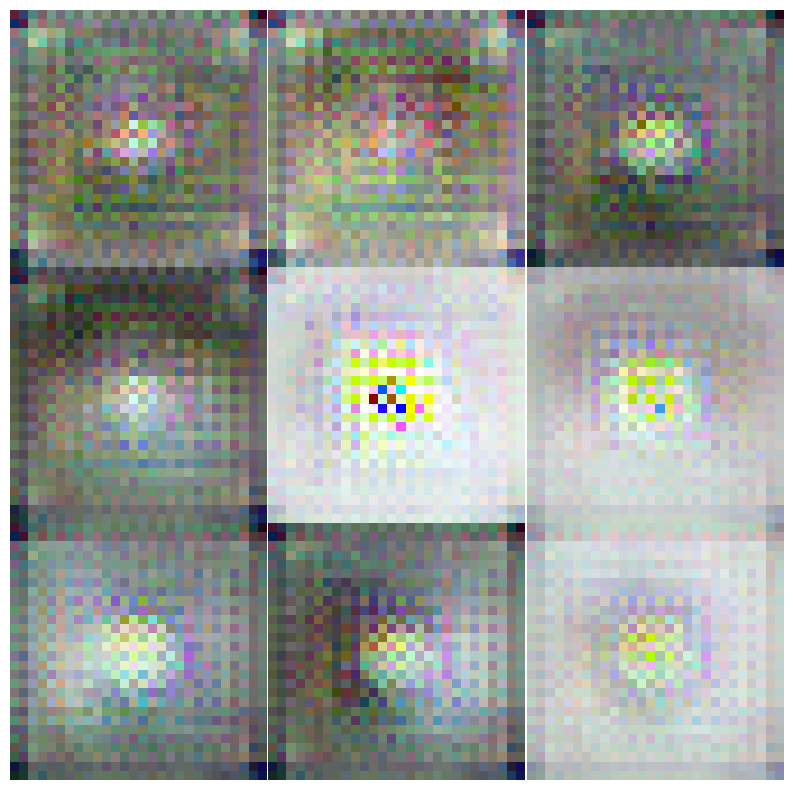

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


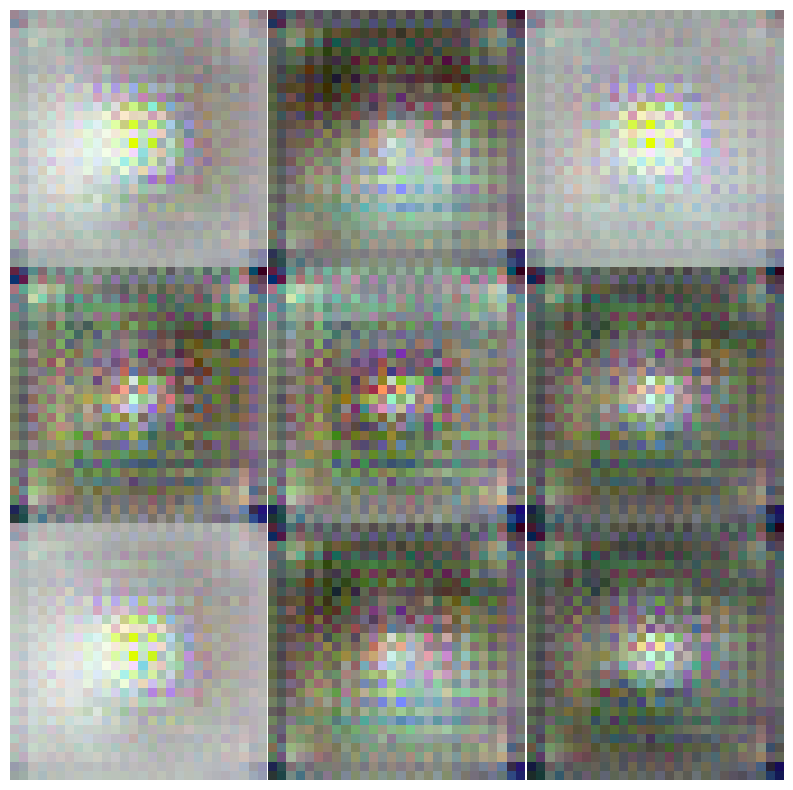

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


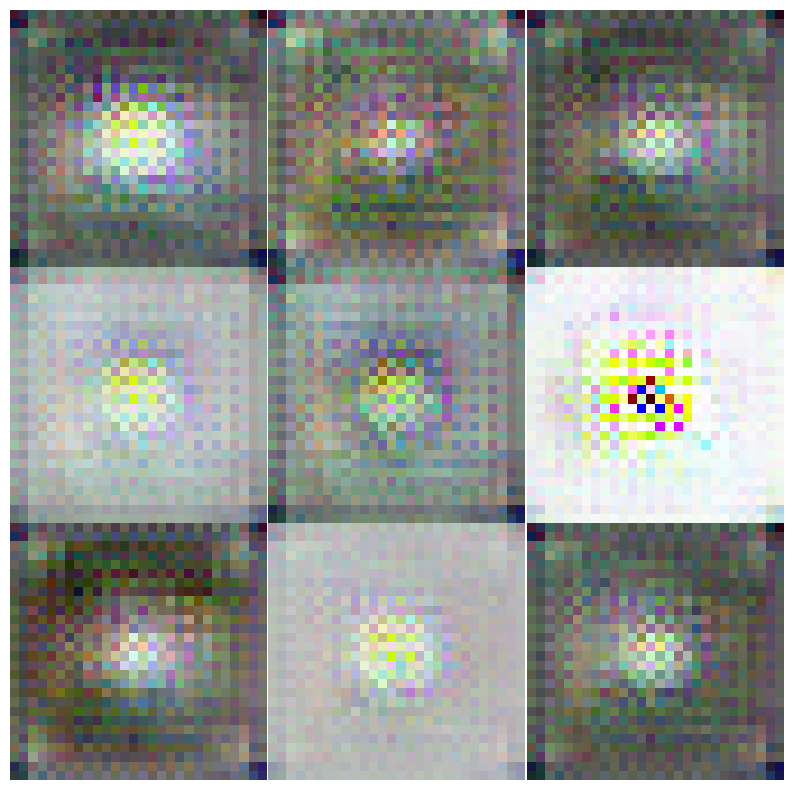

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


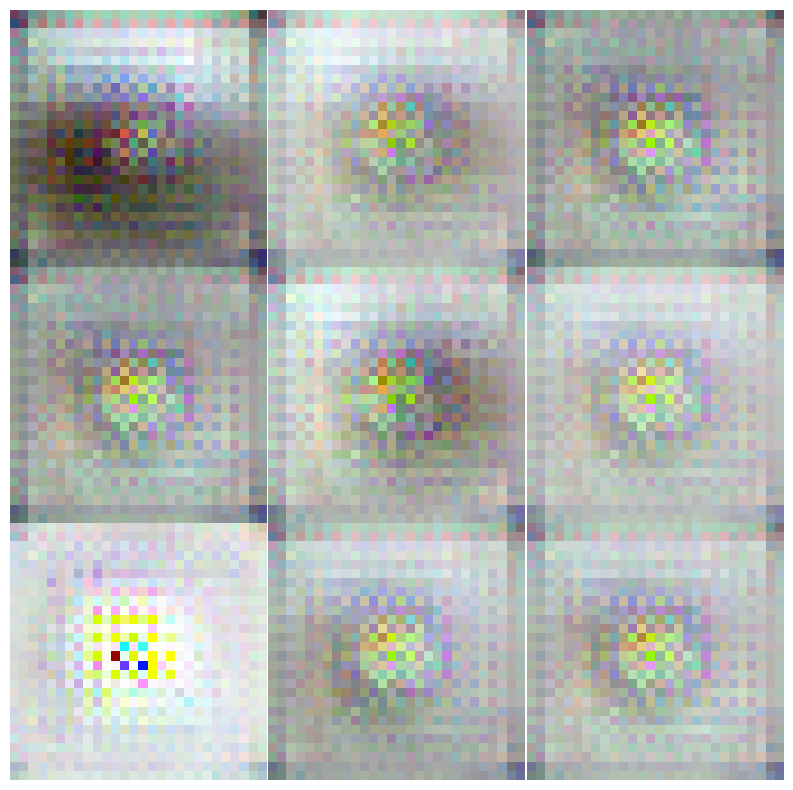

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


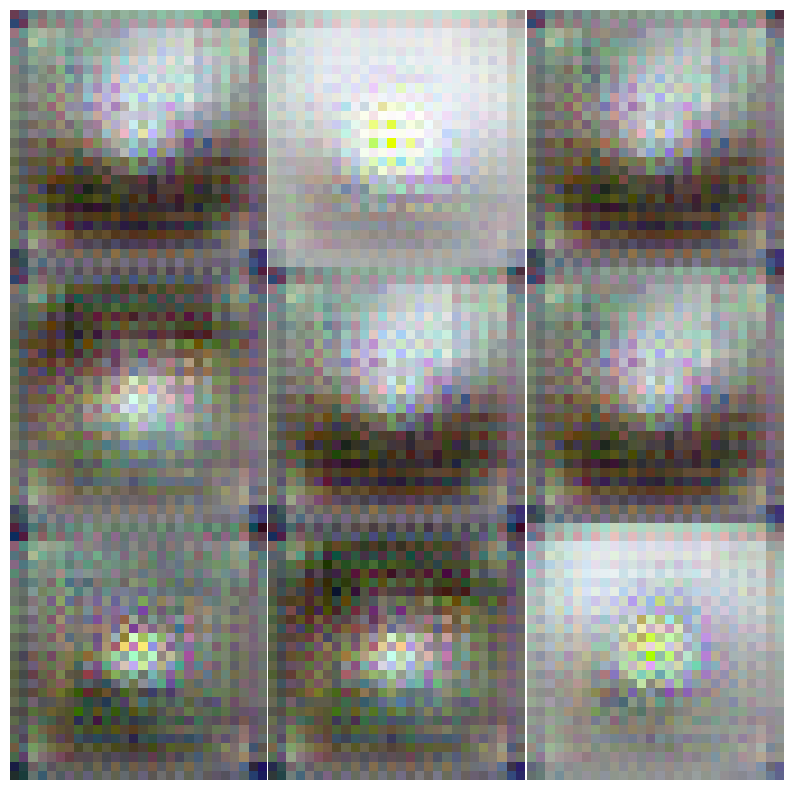

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


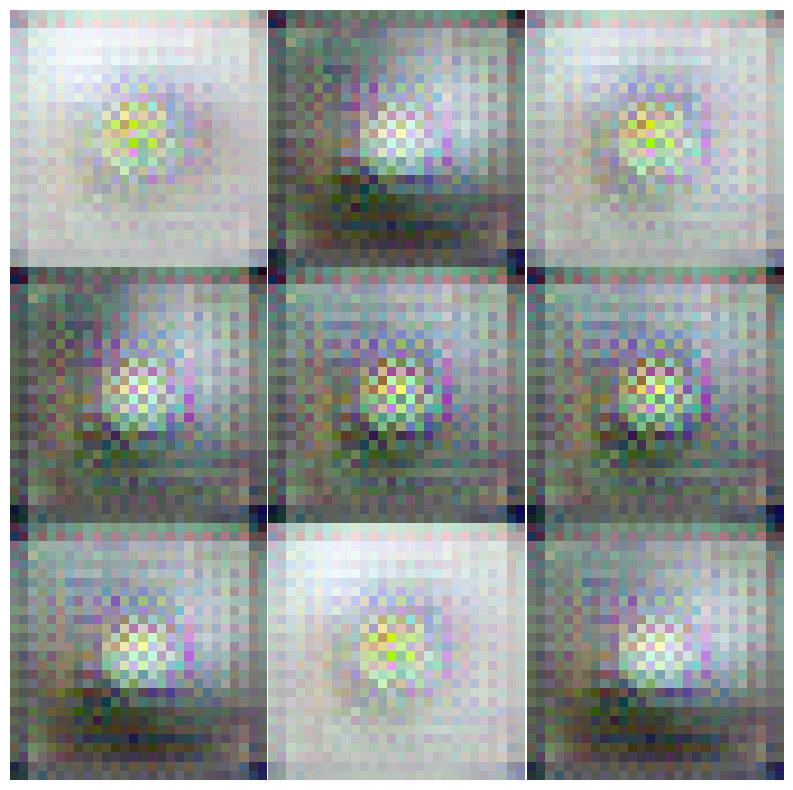

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.84
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.301388
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.300035
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.297881
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.289782
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.286011
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.276469
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.293282
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.242133
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.145984
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.098839
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.969673
Train Epoch: 1 [12000/30000 (40%)]	Loss: 2.017418
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.016866
Trai

Loading...: 100%|██████████| 73/73 [02:09<00:00,  1.77s/it]


Epoch 0: MSE: 0.1419, Contrastive: 3.2261, Combined: 1.6840
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 2.16
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


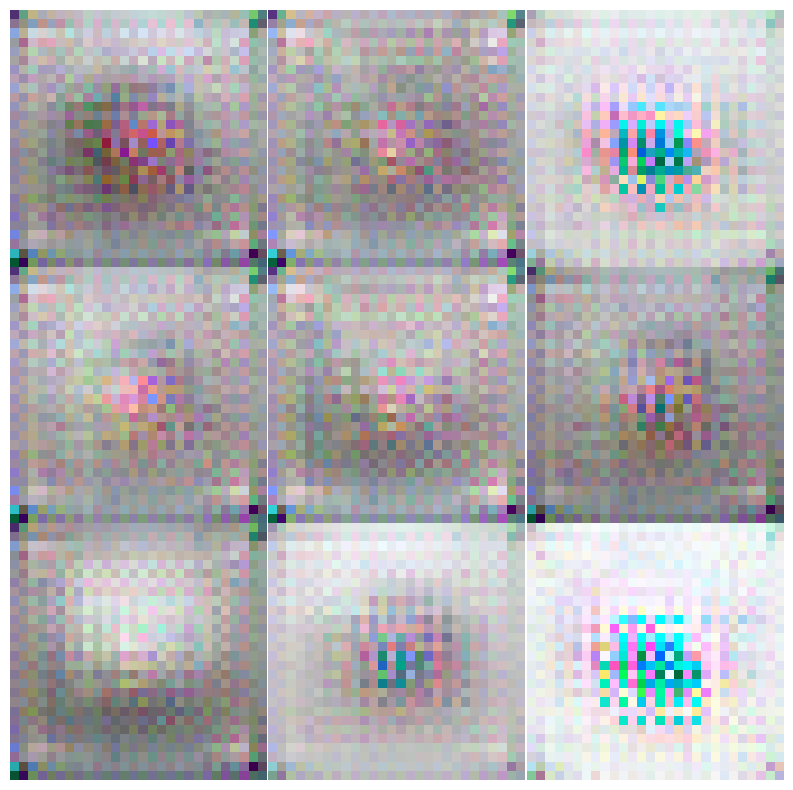

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


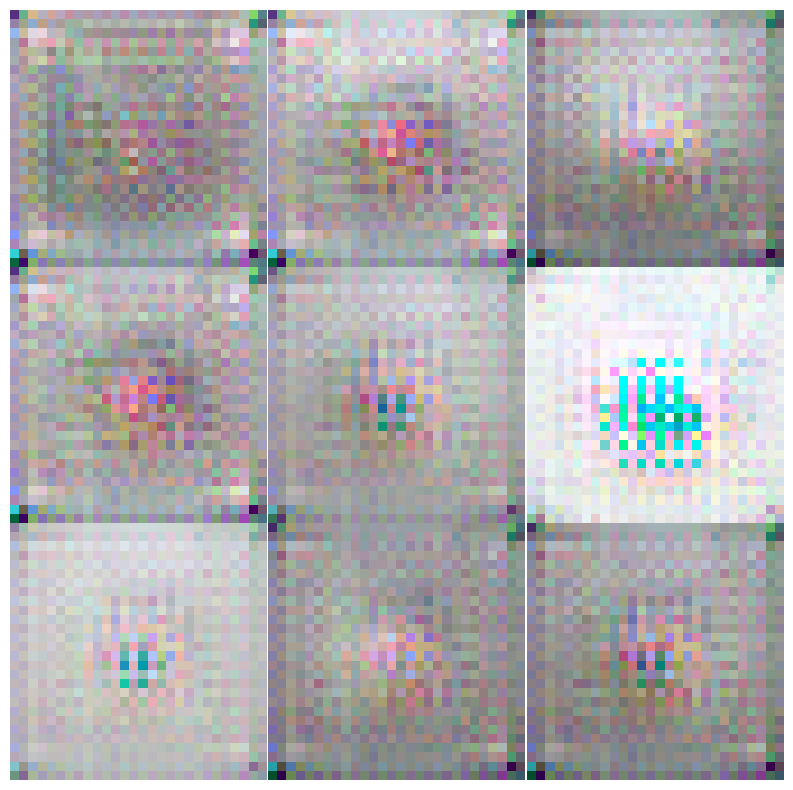

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


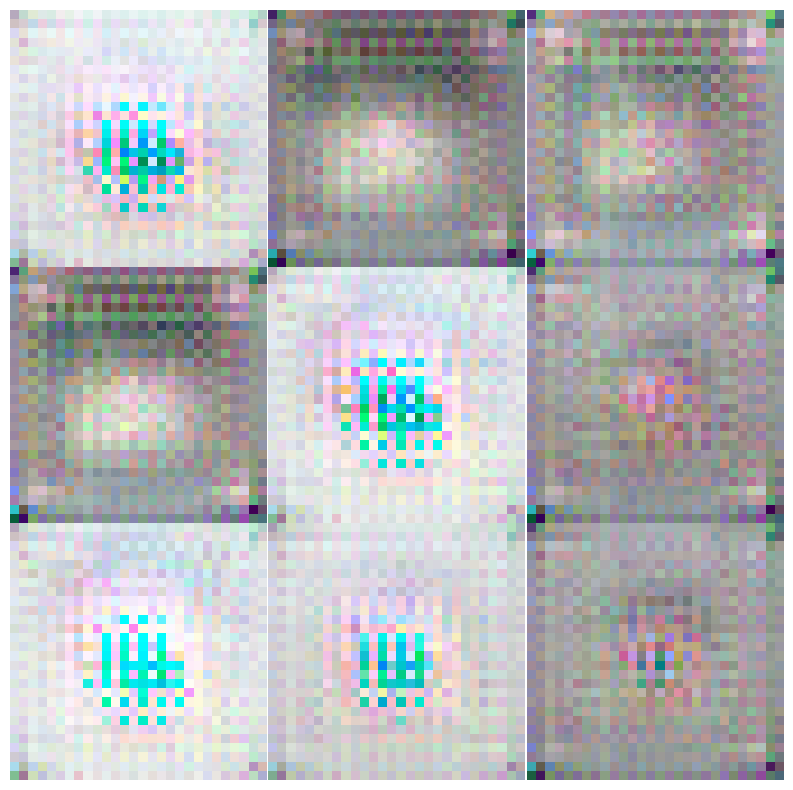

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


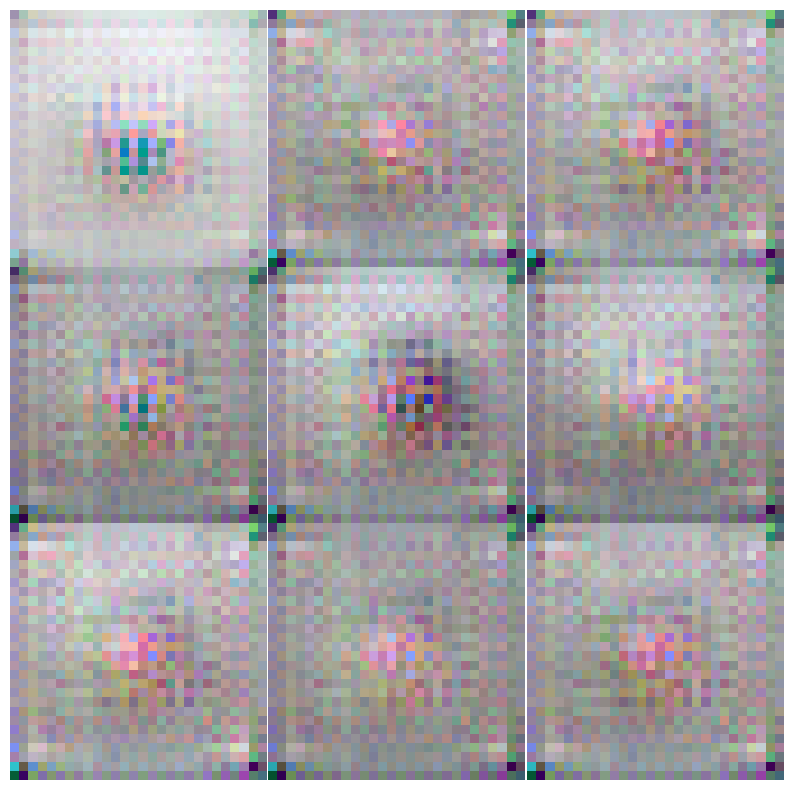

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


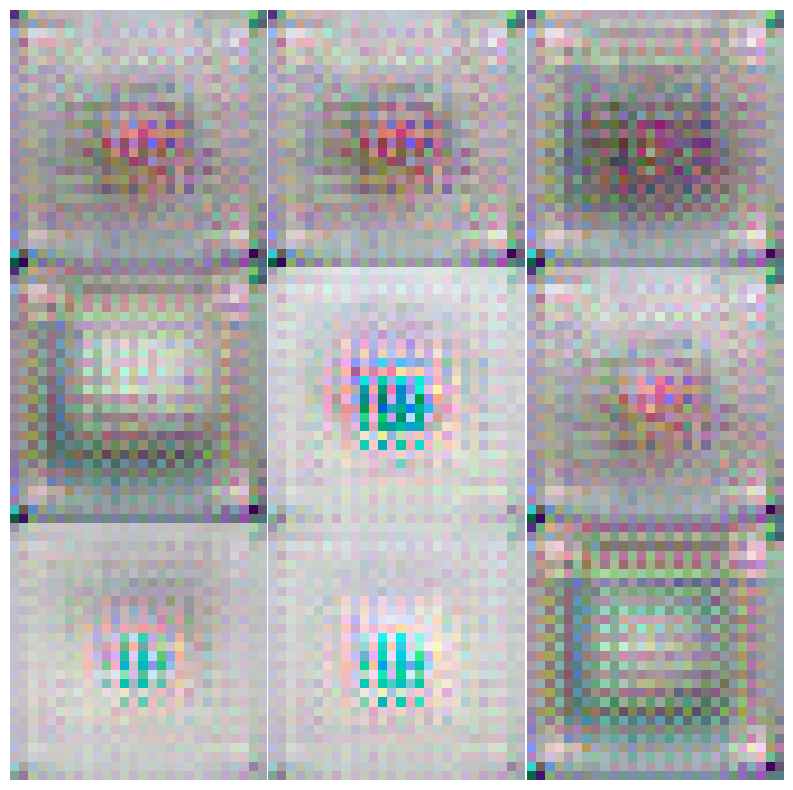

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


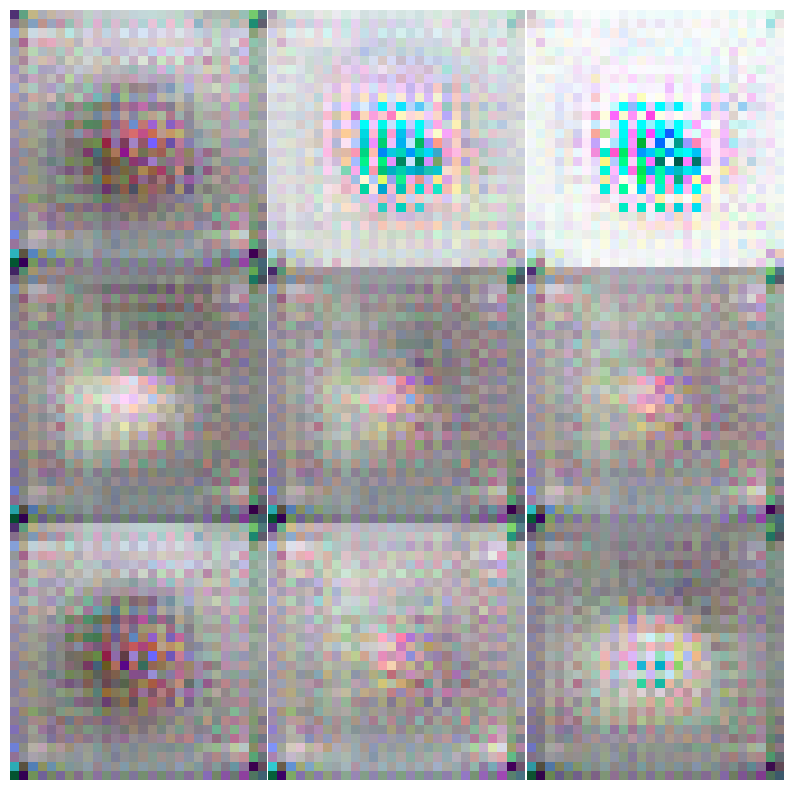

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


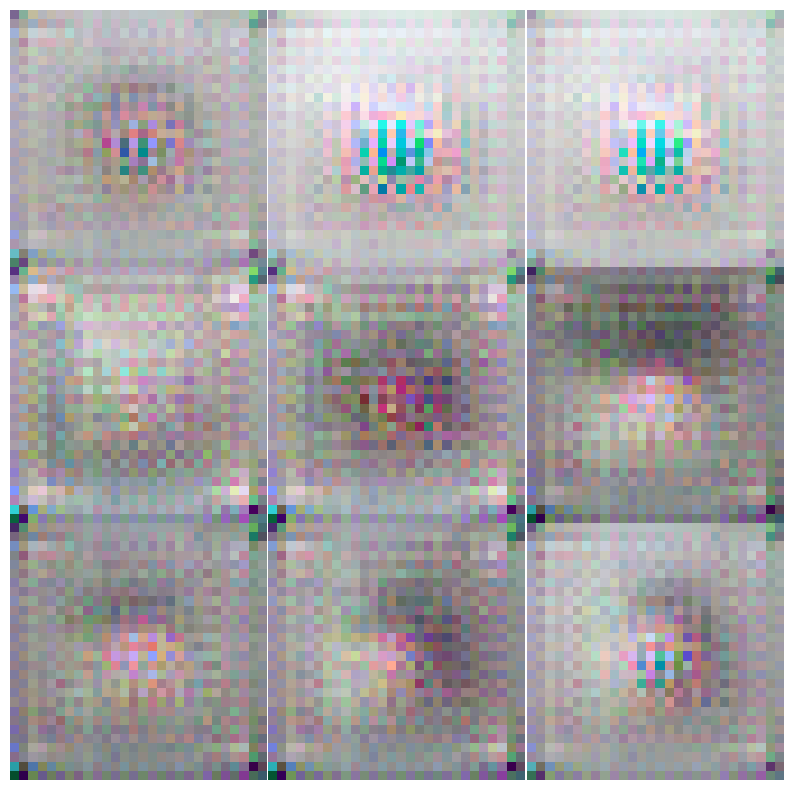

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


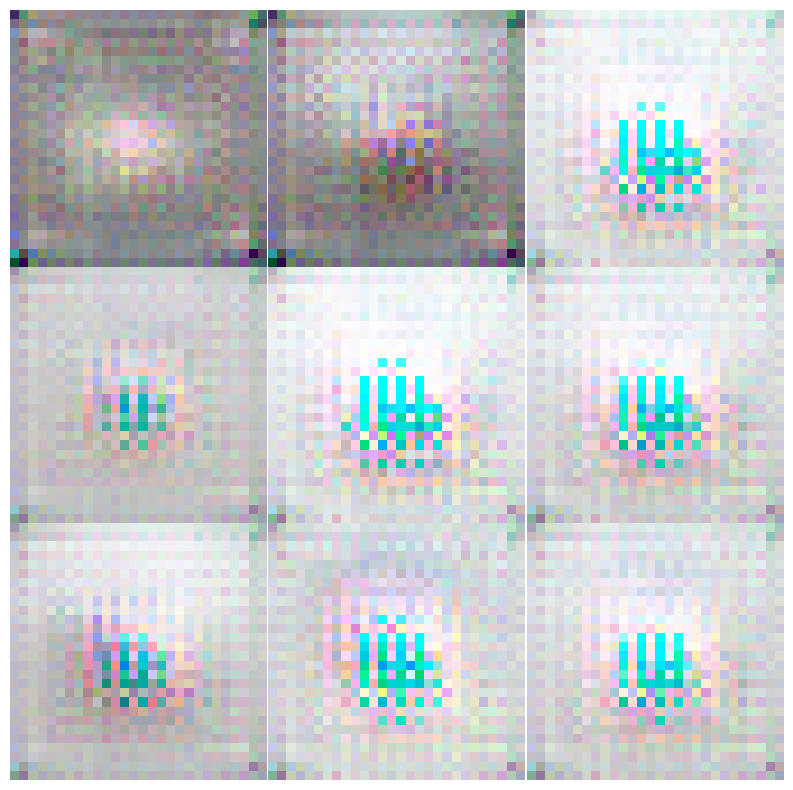

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


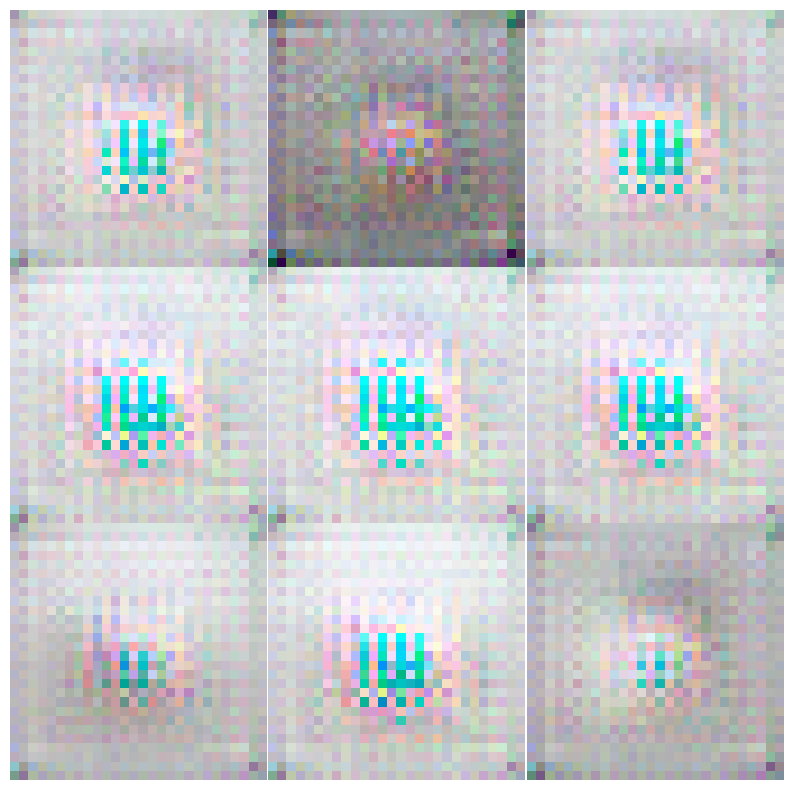

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 2.35
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.305741
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.292207
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.302336
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.292673
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.288827
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.261298
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.204735
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.262785
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.187030
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.165831
Train Epoch: 1 [11000/30000 (37%)]	Loss: 2.154741
Train Epoch: 1 [12000/30000 (40%)]	Loss: 2.080239
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.001291
Trai

Loading...: 100%|██████████| 73/73 [02:35<00:00,  2.13s/it]


Epoch 0: MSE: 0.1182, Contrastive: 3.5288, Combined: 1.8235
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 2.59
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


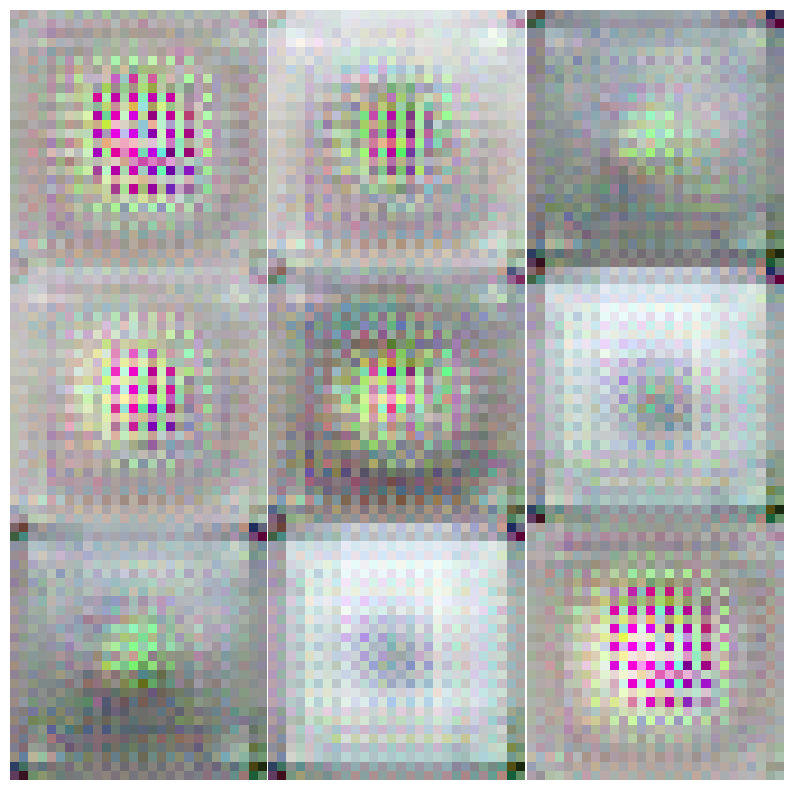

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


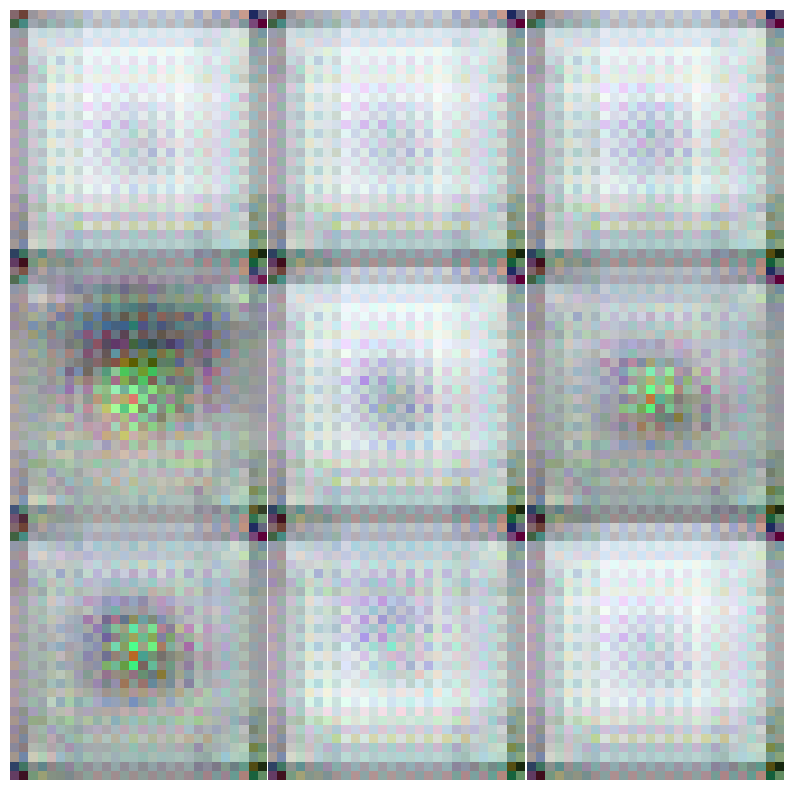

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


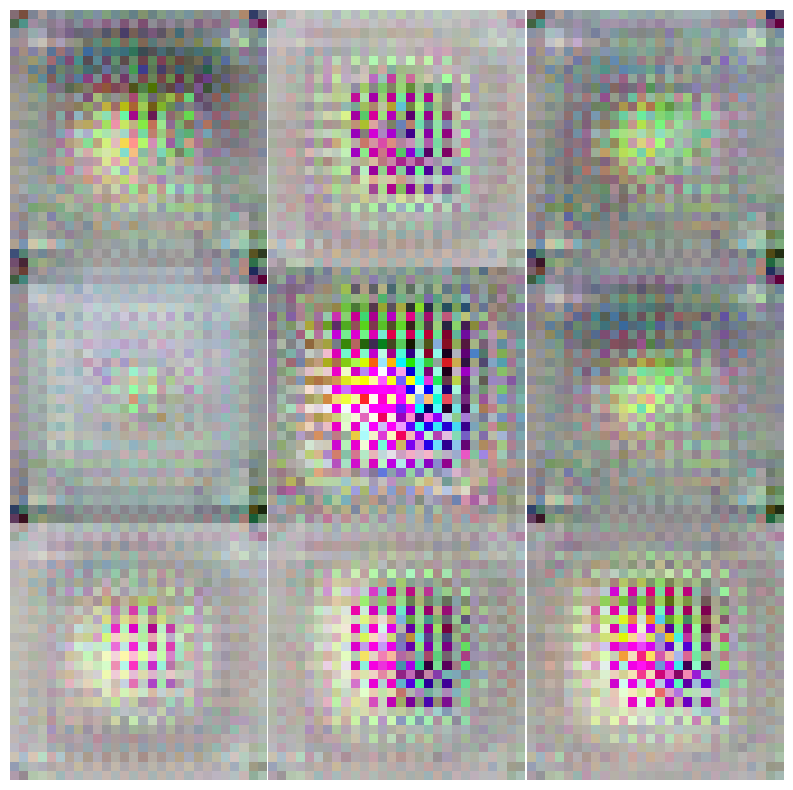

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


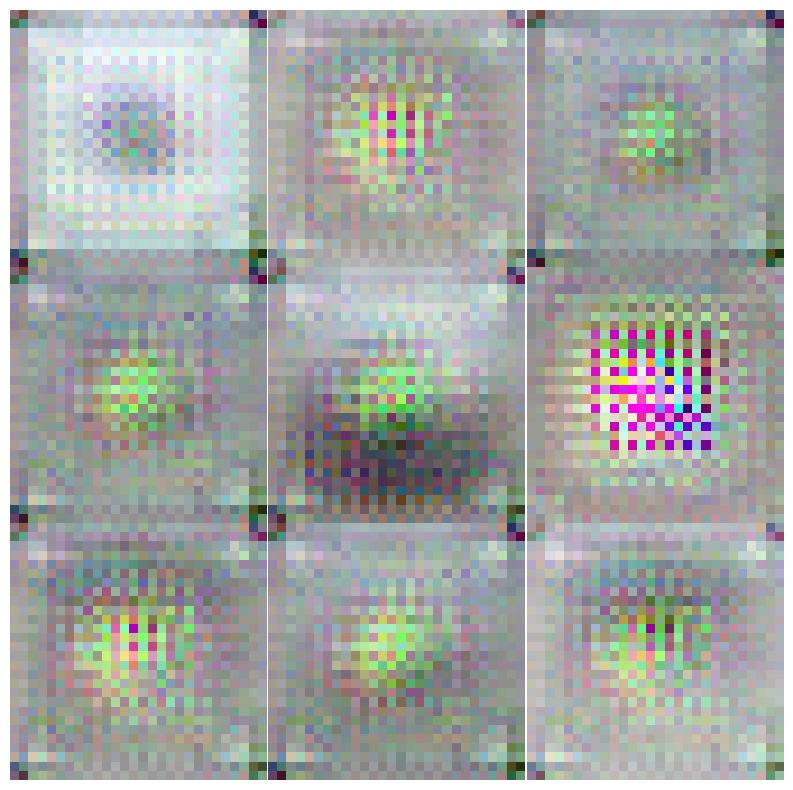

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


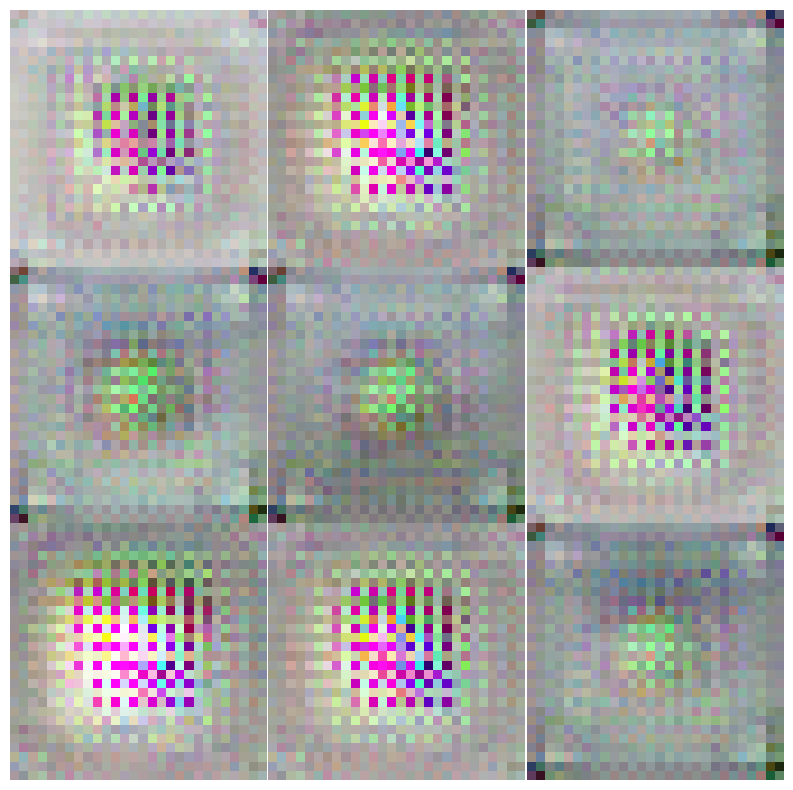

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


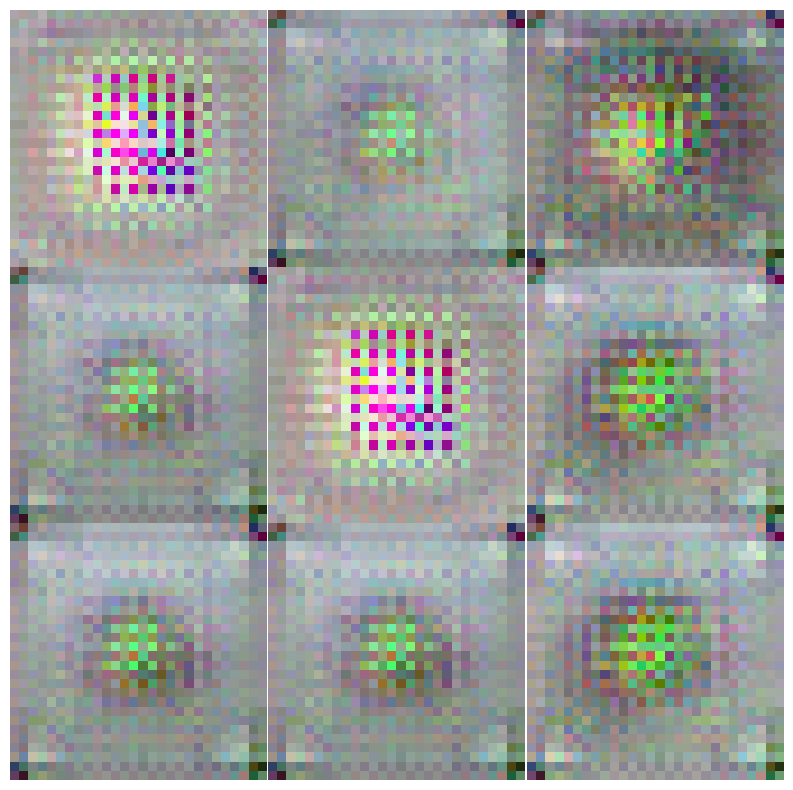

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


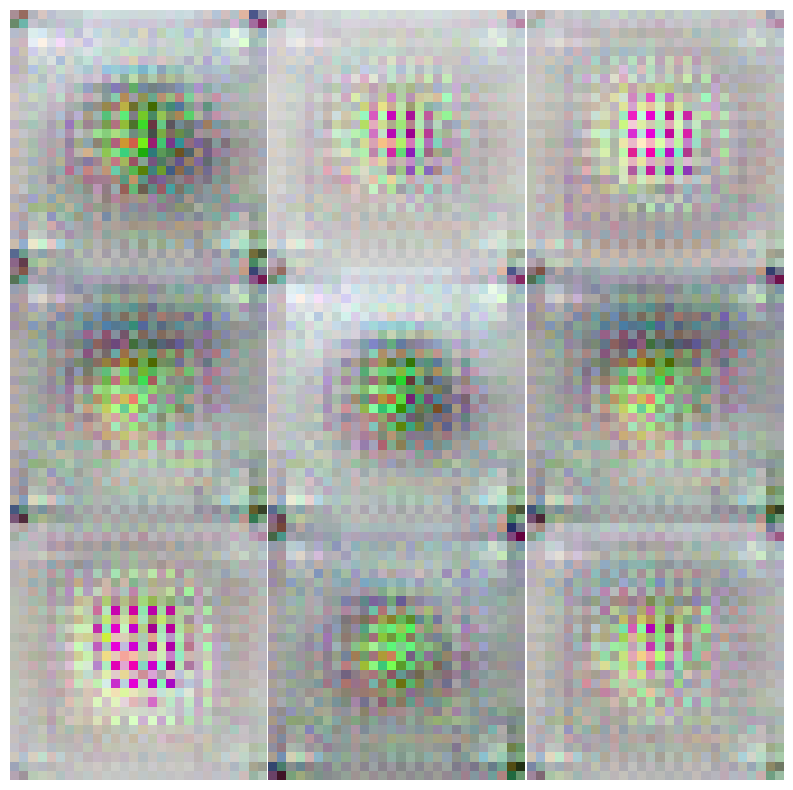

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


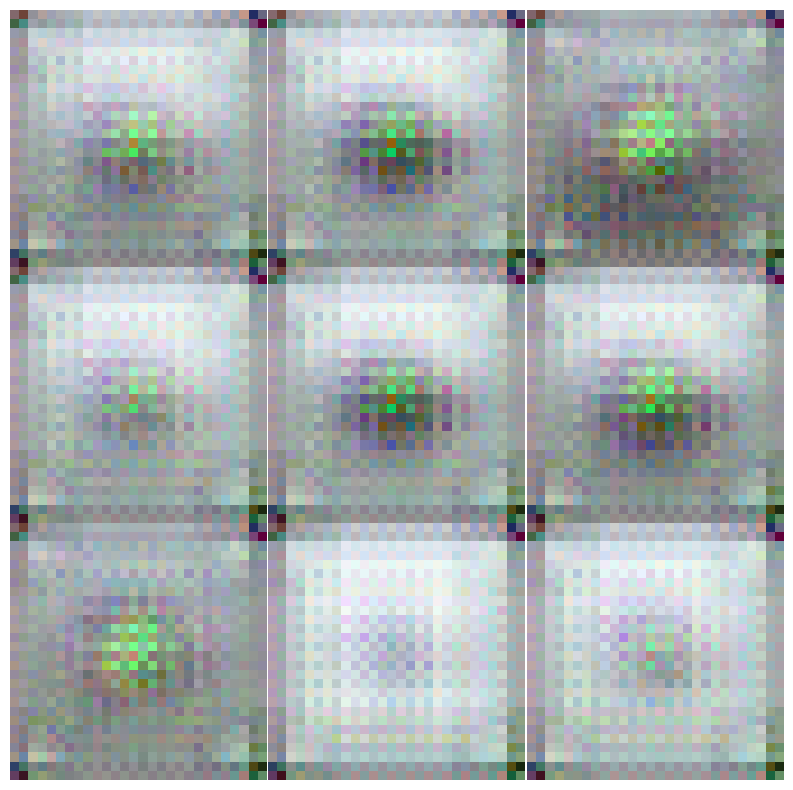

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


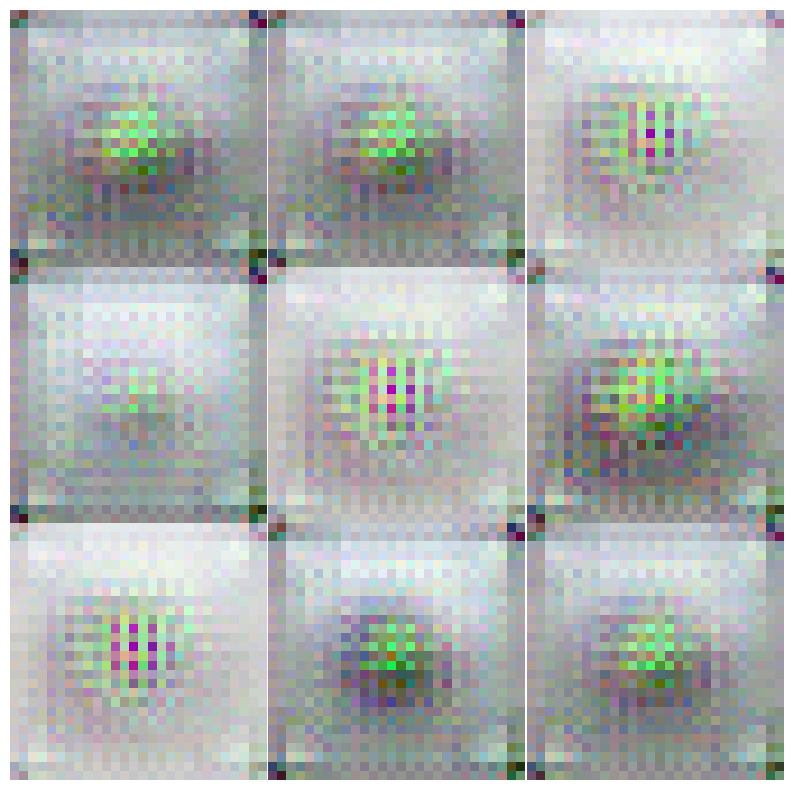

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 1.86
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.293218
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.298490
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.282101
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.253138
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.218887
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.165217
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.058014
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.035420
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.936913
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.025776
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.822848
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.891519
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.794508
Trai

In [ ]:
args['epochs'] = 200 # how many epochs to run for (original used 200)

trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

# initial hyperparams
alpha_start = 0.95   # mostly MSE early
alpha_end   = 0.5    # balance later
tau_start   = 0.25   # soft early
tau_end     = 0.15   # sharper later
num_epochs  = 300    # example

def get_schedules(epoch):
    # linear scheduling
    alpha = alpha_start - (alpha_start - alpha_end) * (epoch / num_epochs)
    tau   = tau_start  - (tau_start  - tau_end)   * (epoch / num_epochs)
    return alpha, tau

temperature = 0.1      # SupCon temperature
alpha = 0.5

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)
    

    #criterion2 = NTXentLoss(temperature=0.5).to(device)
    criterion2 = SupConLoss().to(device)
    
    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0

            encoder.train()
            decoder.train()
            
            epoch_mse = 0.0
            epoch_contrast = 0.0
            #alpha = 1 - min(0.5, epoch / 200)             # weight for MSE vs contrastive loss (1-alpha)
            #alpha, tau = get_schedules(epoch)  # get schedules for alpha and tau
            #print(f"Alpha={alpha:.4f}, tau={tau:.4f}")
            
            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                images, labs = images.to(device), labs.to(device)
                labsn = labs.detach().cpu().numpy()

                # run images
                z_hat,class_hat = encoder(images,labsn)
                
                # sort z_hat and class_hat by labels
                sort_z_hat = [[] for _ in range(args['num_class'])]
                for i, label in enumerate(labsn):
                    sort_z_hat[label].append(z_hat[i].cpu().detach().numpy())

                # Check if sort_z_hat is empty
                z_hat_to_concat = []
                for tensor in sort_z_hat:
                    if len(tensor) != 0:
                        z_hat_to_concat.append(torch.tensor(tensor).to(device))
                        
                if z_hat_to_concat:
                    combined_z_hat = torch.cat(z_hat_to_concat, dim=0)
                    #print('combined_z_hat',combined_z_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_z_hat = torch.zeros((1, args['n_z'])).to(device)

                # Check if class_hat is empty
                class_hat_to_concat = []
                for tensor in class_hat:
                    if len(tensor) != 0:
                        class_hat_to_concat.append(tensor)
                if class_hat_to_concat:
                    combined_class_hat = torch.cat(class_hat_to_concat, dim=0)
                    #print('combined_class_hat',combined_class_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_class_hat = torch.zeros((1, args['n_z'])).to(device)

                # Combine the views using torch.stack()
                # `dim=1` places the new "views" dimension at the second position.
                
                # *Option* L2 normalization
                combined_z_hat = F.normalize(combined_z_hat, dim=1)
                combined_class_hat = F.normalize(combined_class_hat, dim=1)
                
                features = torch.stack([combined_z_hat, combined_class_hat], dim=1)
                # The new shape of the 'features' tensor is [100, 2, 300]
                #print(features.shape)
                
                mse2 = criterion2(features=features, labels=torch.from_numpy(labsn).long(), temperature=temperature)
                
                
                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                # --- MSE loss ---
                mse = criterion(x_hat, images)
     
                # --- Combined loss ---
                comb_loss = alpha * mse + (1 - alpha) * mse2
                comb_loss.backward()
                
                # --- Step optimizers ---
                enc_optim.step()
                dec_optim.step()
                
                # accumulate for logging
                epoch_mse += mse.item() * images.size(0)
                epoch_contrast += mse2.item() * images.size(0)         

            # --- Log epoch losses ---
            avg_mse = epoch_mse / len(train_loader.dataset)
            avg_contrast = epoch_contrast / len(train_loader.dataset)
            avg_comb = avg_mse * alpha + avg_contrast * (1-alpha)
            print(f"Epoch {epoch}: MSE: {avg_mse:.4f}, Contrastive: {avg_contrast:.4f}, Combined: {avg_comb:.4f}")
            trainingDataset_loss.append(train_loss)
            
        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    import numpy as np
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    print('------ Plot Latent Space ------')
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    print('------------------------------')
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    import time
    import os
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) 
            print('class',yclass[0]) 
    
            #encode xclass to feature space
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) 

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    from sklearn.manifold import TSNE
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    # Load the training images and labels
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    print('------ Plot Balanced Imgs ------')

    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(dec_x)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    fig.show()
    
    print('------------------------------')
    #  IMPORT BALANCED IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    ###########################  TRAIN CNN  ####################################################
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    #set hyperparameters
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    ########################### TEST CNN ####################################################
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))

### Avg via folders

In [28]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

Average Accuracy: 0.851208
Average Sensitivity: 0.25604
Average Specificity: 0.9173377777777777
Average Precision: 0.24668027066190482

G-mean: 0.48458915768937505
F-measure: 0.2510643370211374

ACSA: 0.553624
[array([[793,  64,  55,  73,   8,   3,   0,   1,   2,   1],
       [199, 680,  23,  89,   5,   0,   1,   0,   2,   1],
       [217,  53, 367, 307,  42,   6,   0,   5,   0,   3],
       [119,  91, 129, 617,  26,   9,   2,   5,   0,   2],
       [150,  54, 330, 332, 117,  13,   0,   0,   0,   4],
       [108,  96, 146, 594,  30,  21,   1,   2,   2,   0],
       [ 84,  55, 298, 498,  50,   6,   6,   1,   0,   2],
       [280, 106, 174, 364,  62,   7,   1,   6,   0,   0],
       [683, 168,  60,  82,   5,   1,   1,   0,   0,   0],
       [326, 430,  53, 175,   6,   4,   0,   1,   2,   3]]), array([[785, 132,  62,  10,   9,   0,   1,   1,   0,   0],
       [144, 795,  29,  23,   8,   0,   1,   0,   0,   0],
       [239, 118, 461,  79,  86,   6,   7,   2,   1,   1],
       [185, 188, 30

## Traning - Gen - Evalution (SelfSubCon)


Start...
cpu


Loading...: 100%|██████████| 73/73 [02:22<00:00,  1.95s/it]


Epoch 0: MSE: 0.1191, Contrastive: 0.6449, Combined: 0.3820
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 2.38
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


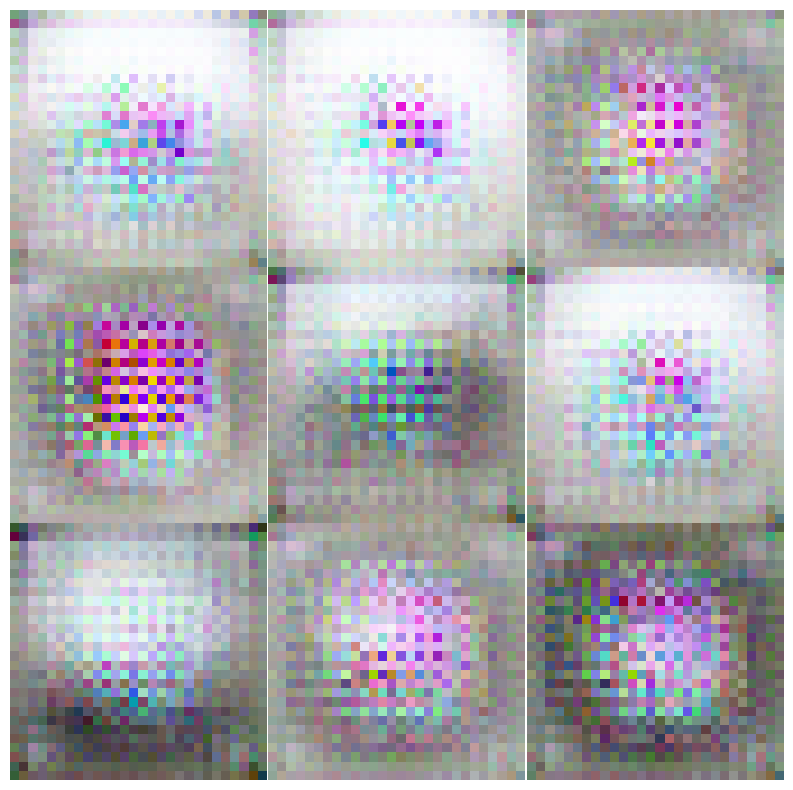

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


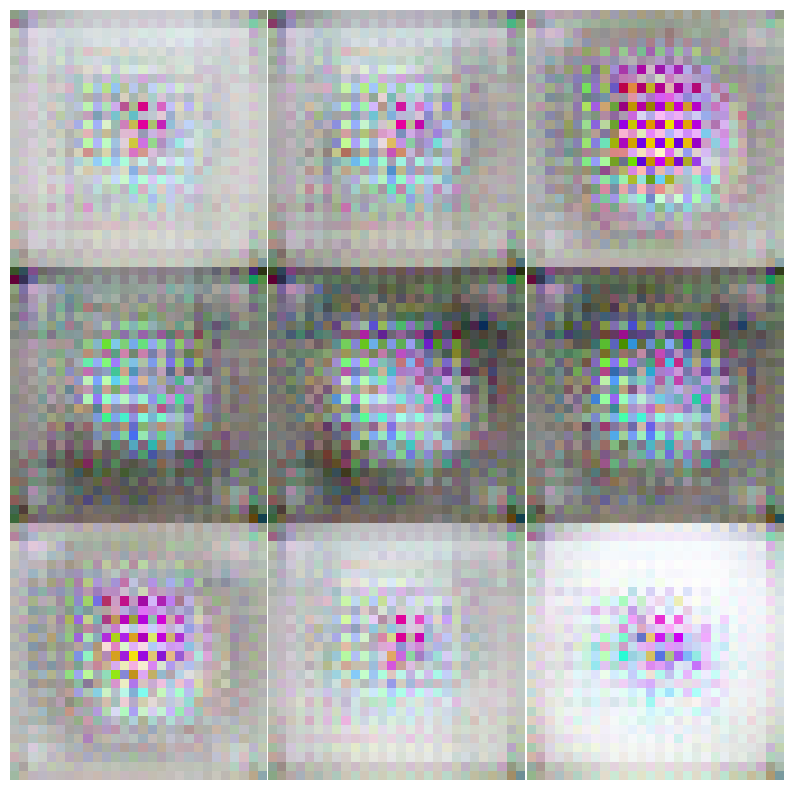

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


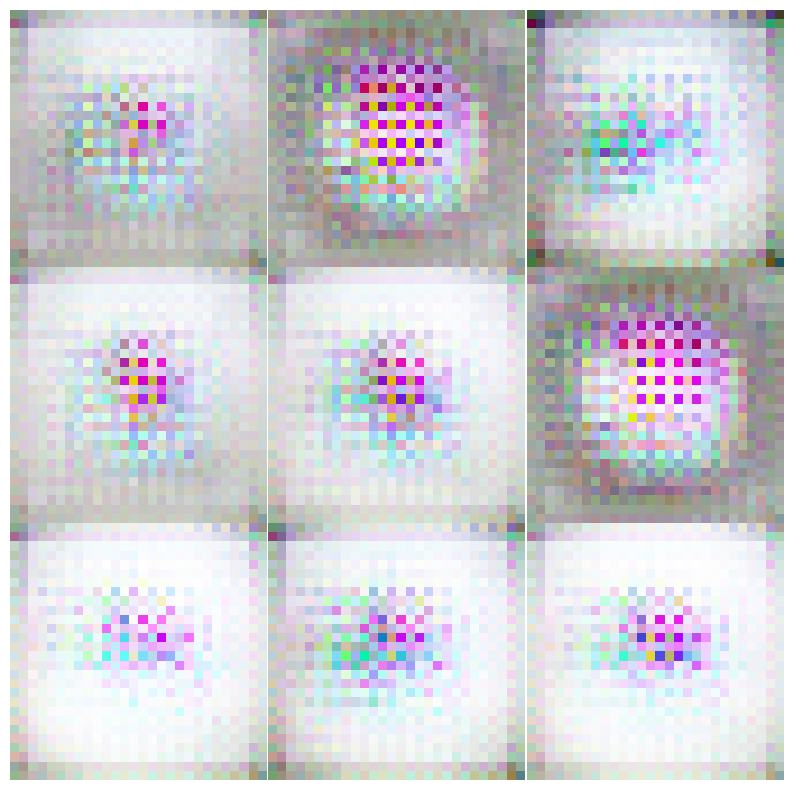

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


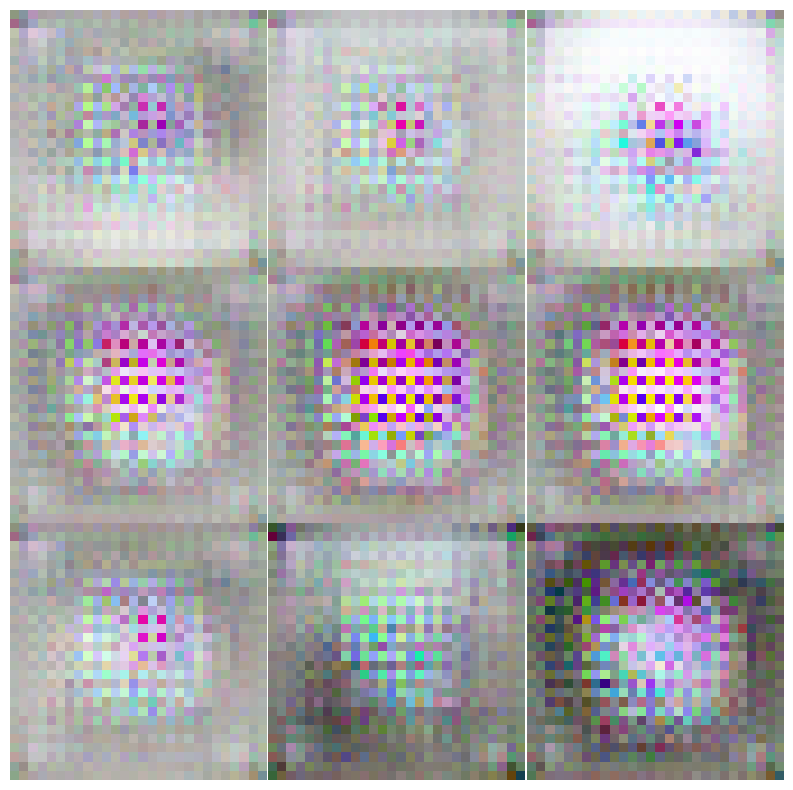

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


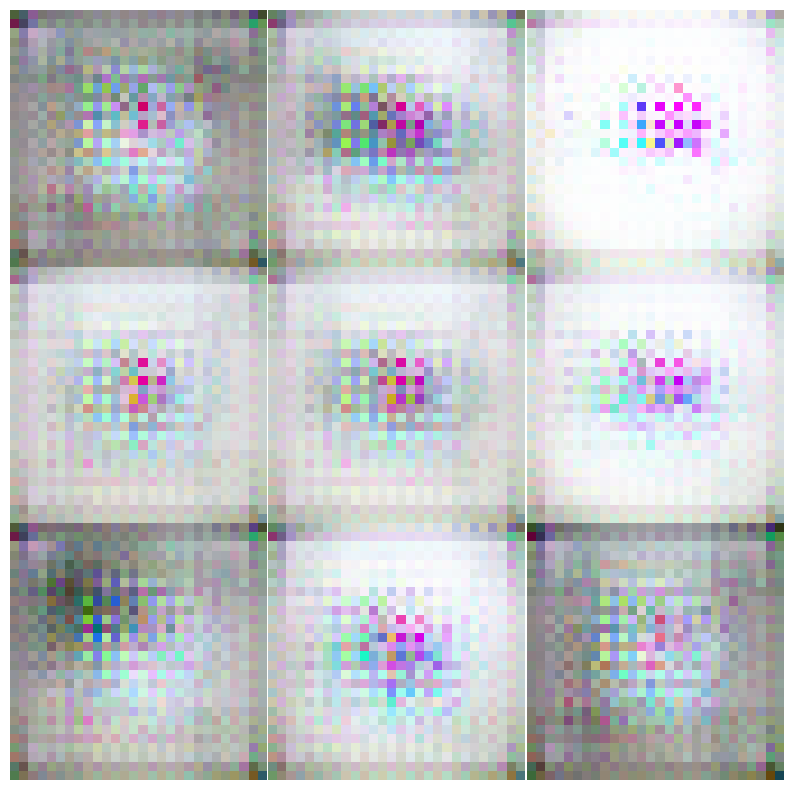

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


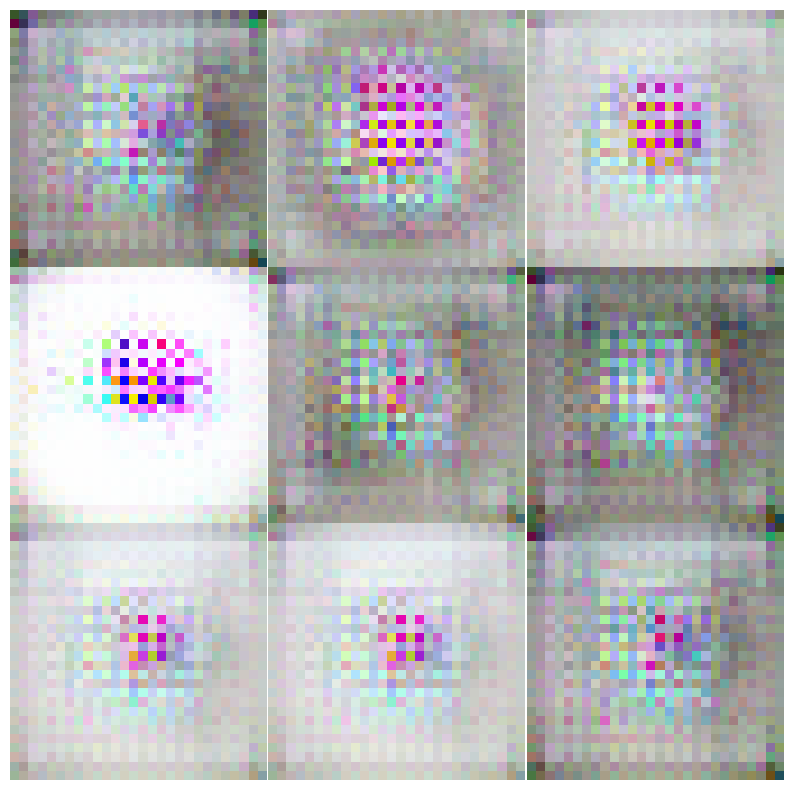

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


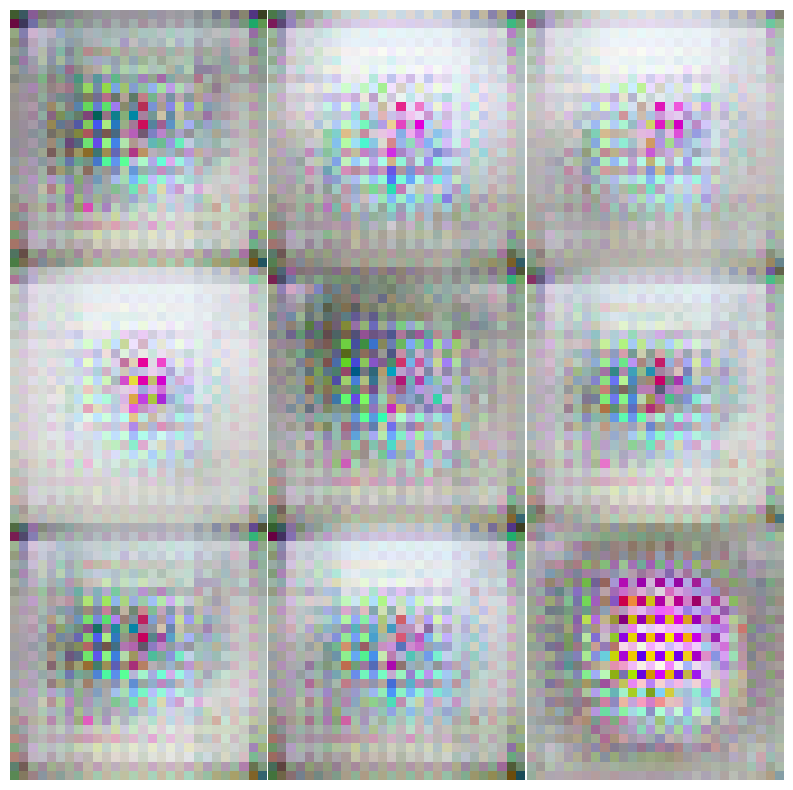

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


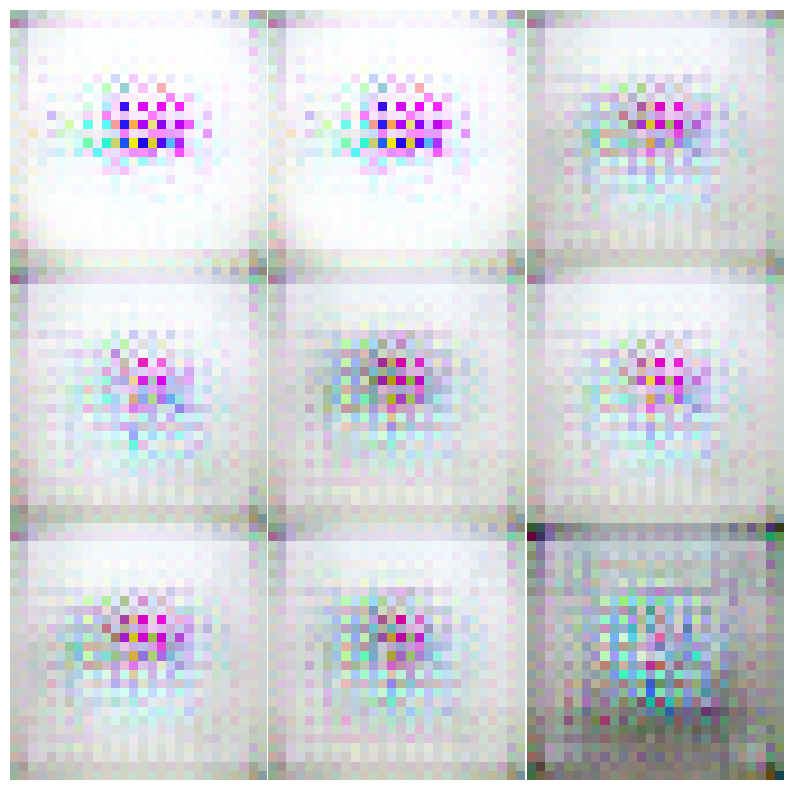

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


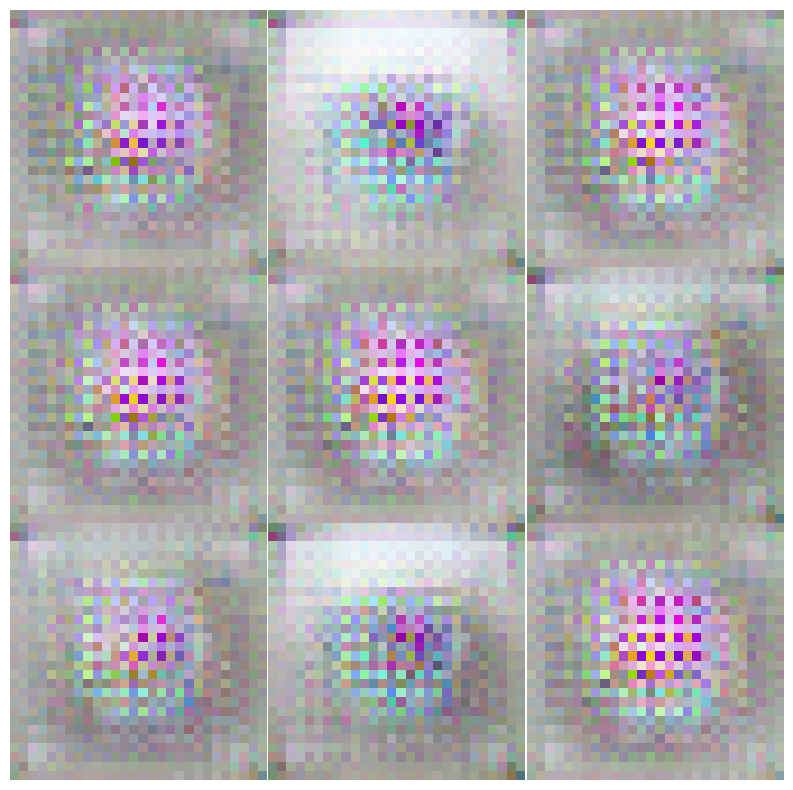

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 1.43
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.300920
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.279293
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.282407
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.265128
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.214882
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.158364
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.146032
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.124006
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.041691
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.985065
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.832946
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.577335
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.762212
Trai

Loading...: 100%|██████████| 73/73 [01:26<00:00,  1.19s/it]


Epoch 0: MSE: 0.1137, Contrastive: 0.5088, Combined: 0.3112
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 1.45
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


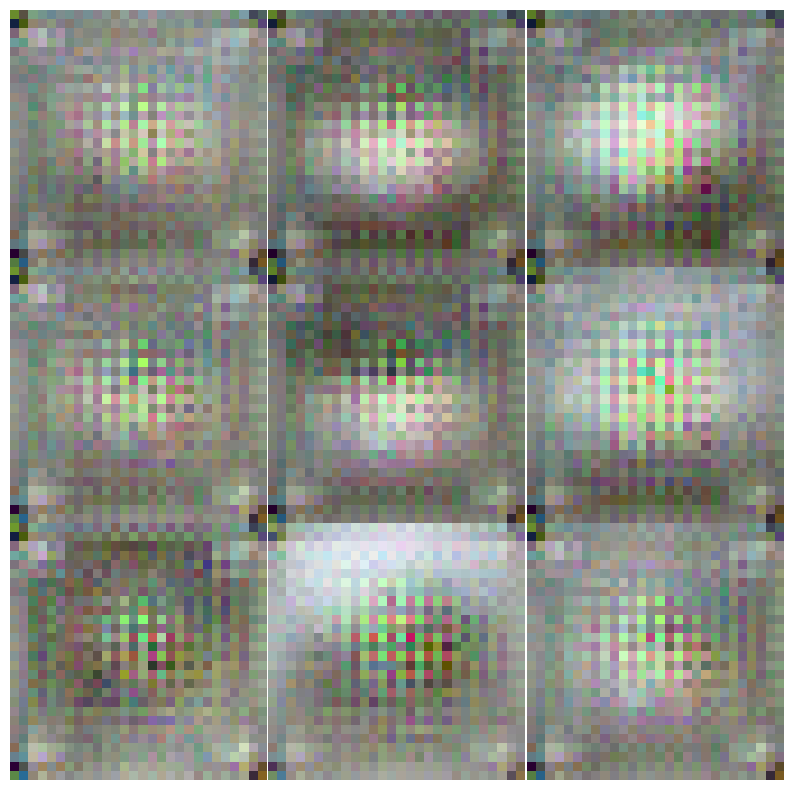

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


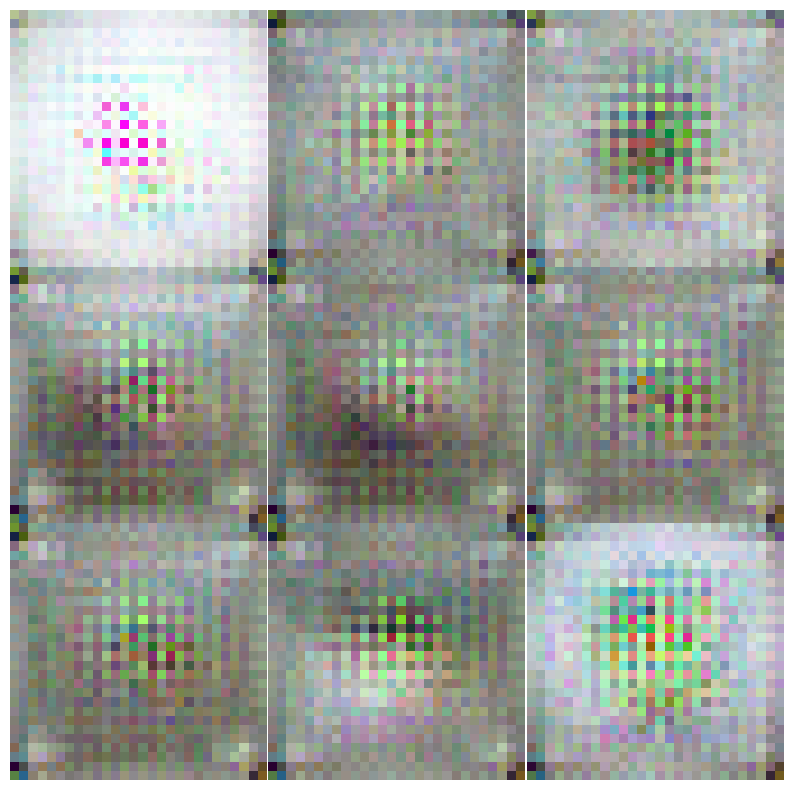

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


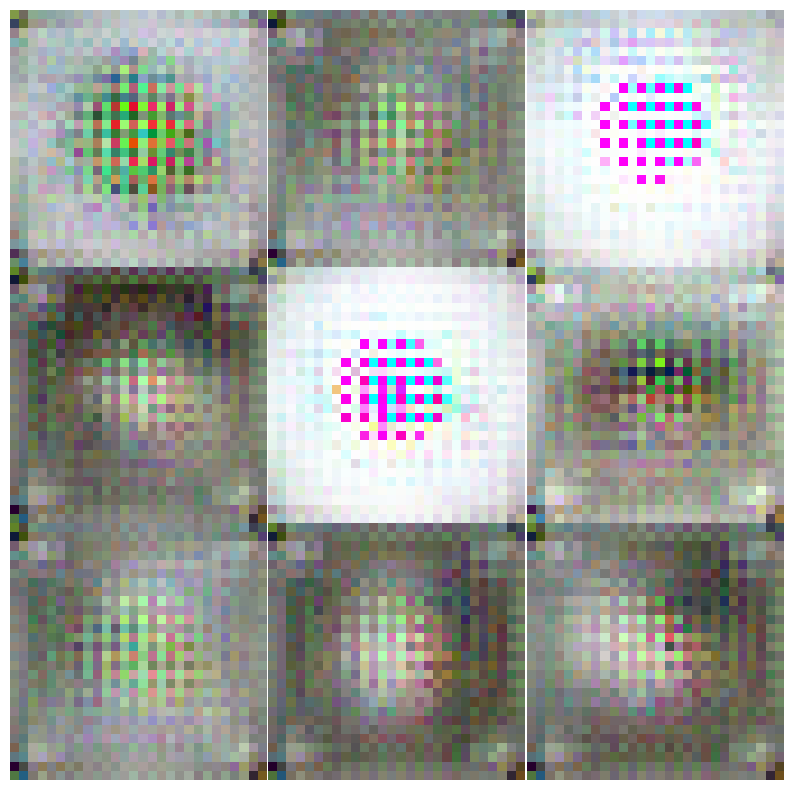

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


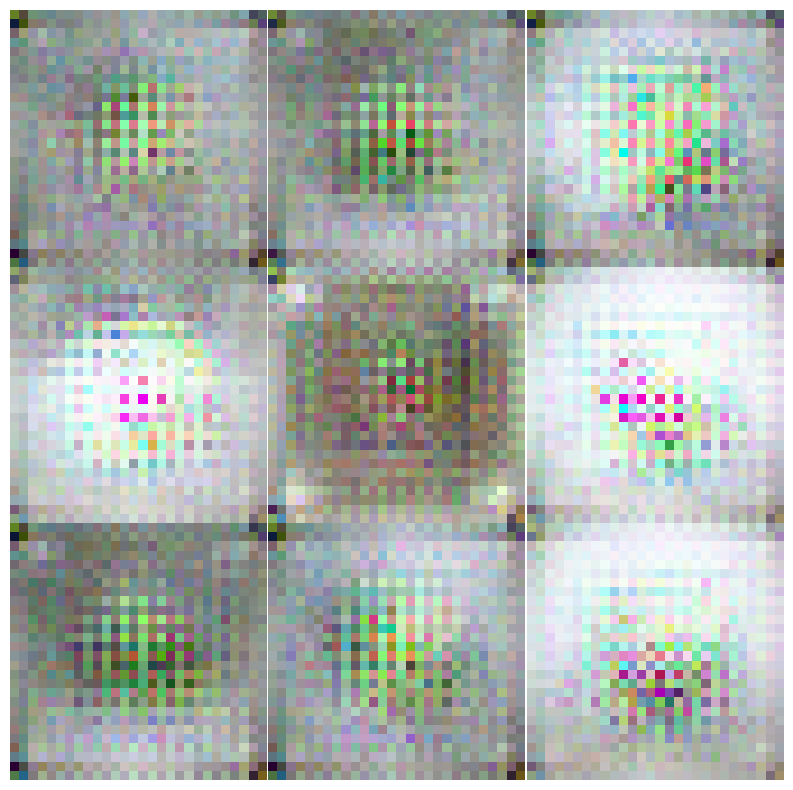

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


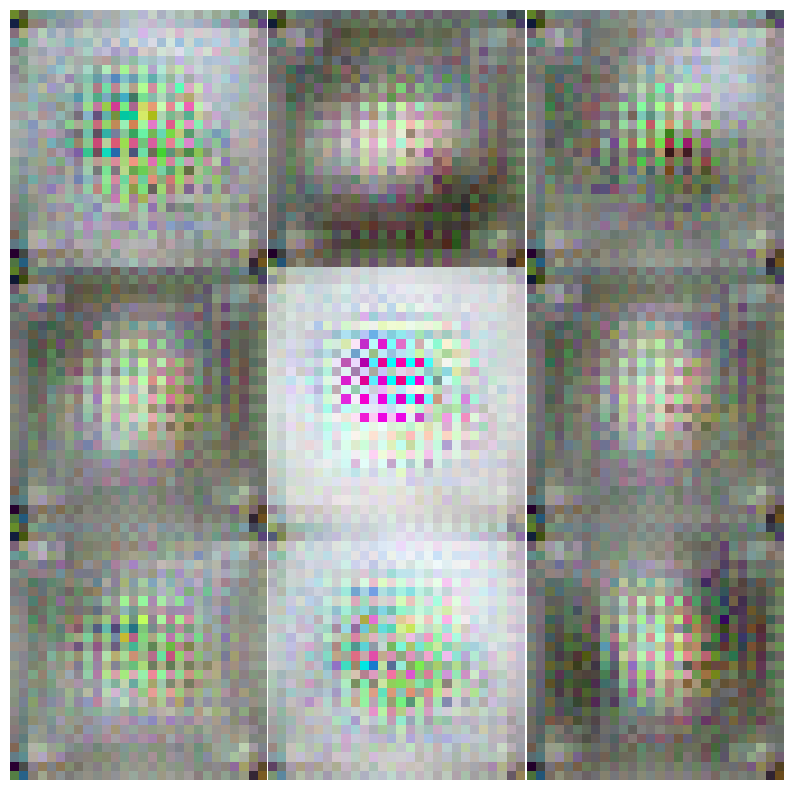

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


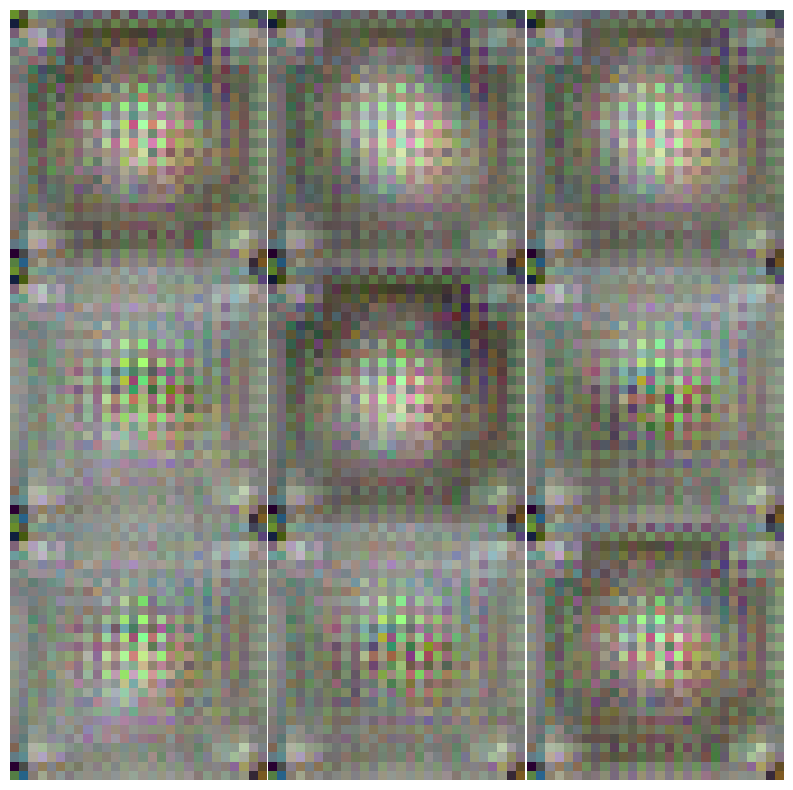

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


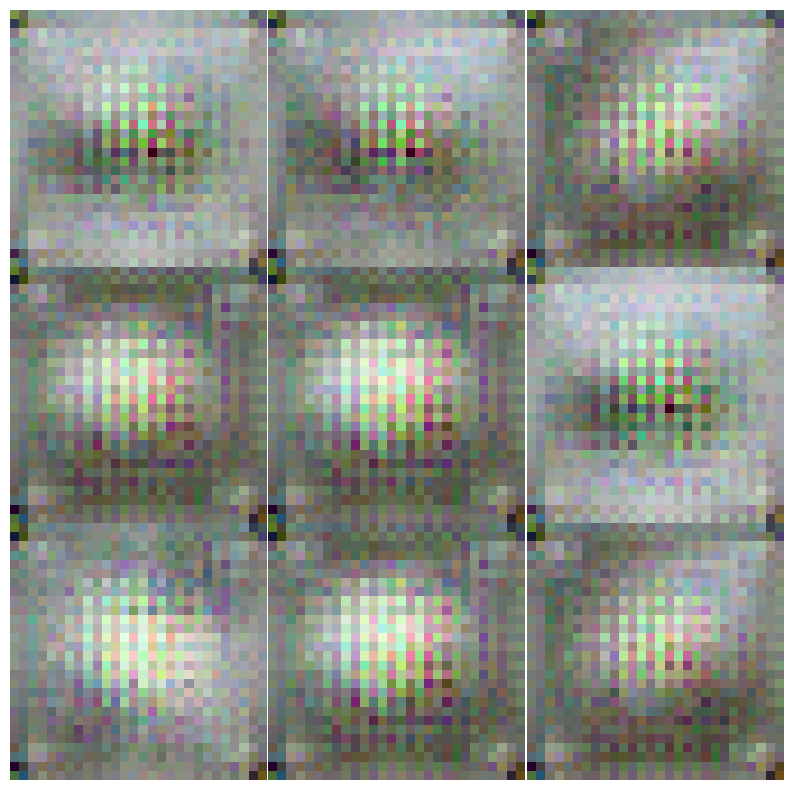

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


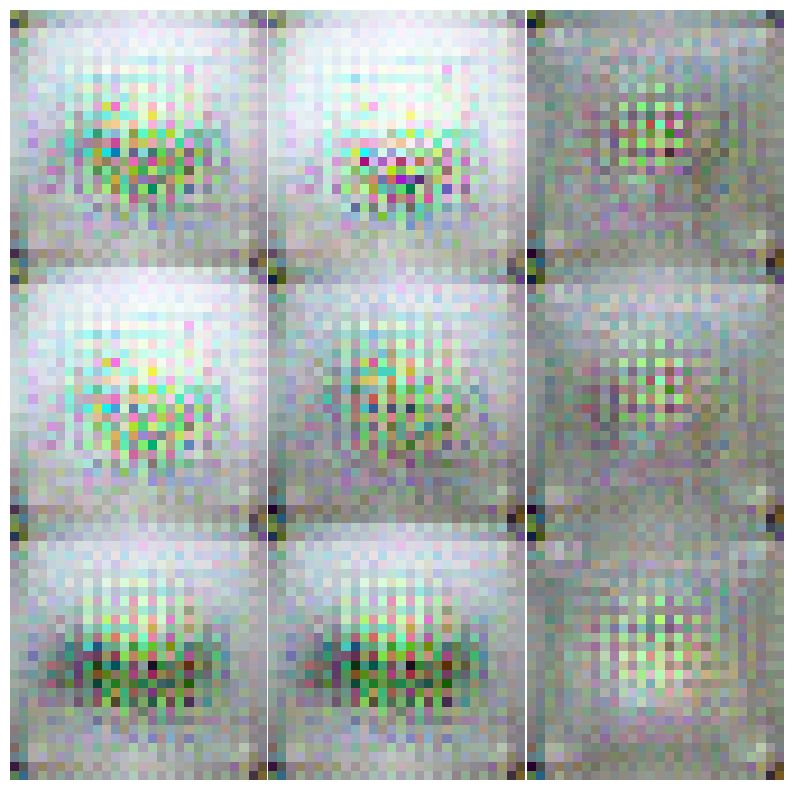

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


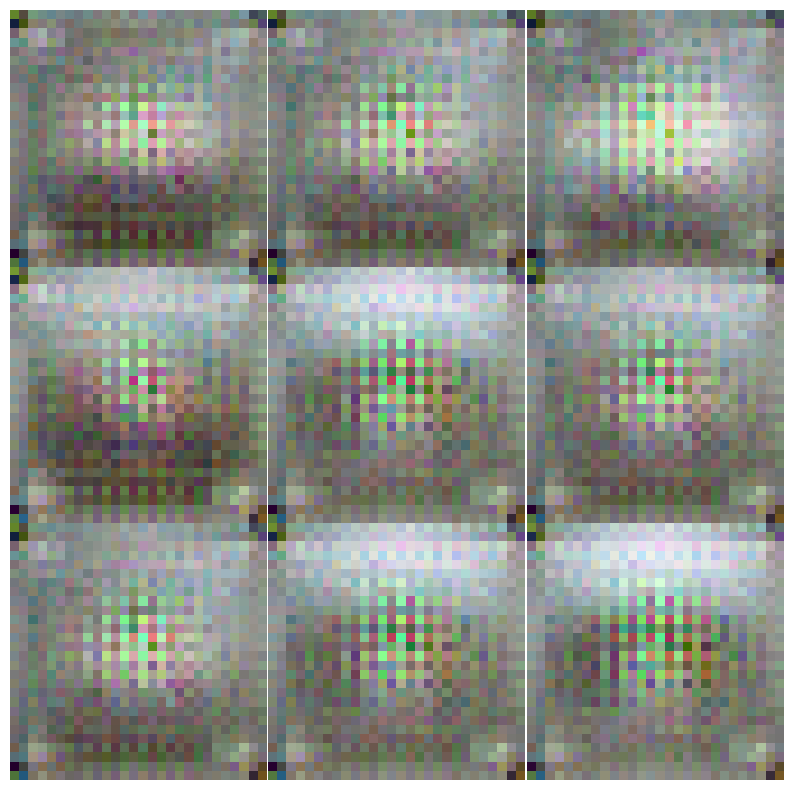

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.92
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.295784
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.288605
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.295312
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.278706
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.272227
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.263900
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.269185
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.201925
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.211171
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.181295
Train Epoch: 1 [11000/30000 (37%)]	Loss: 2.181310
Train Epoch: 1 [12000/30000 (40%)]	Loss: 2.094769
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.111123
Trai

Loading...: 100%|██████████| 73/73 [01:35<00:00,  1.31s/it]


Epoch 0: MSE: 0.1308, Contrastive: 0.6065, Combined: 0.3687
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/enc.pth
/Users/suvapornhomjandee/Desktop/SuvapornLab_main/Suvaporn_Lab/DeepSMOTE/CLDeepSMOTE/model/dec.pth

total time(min): 1.60
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


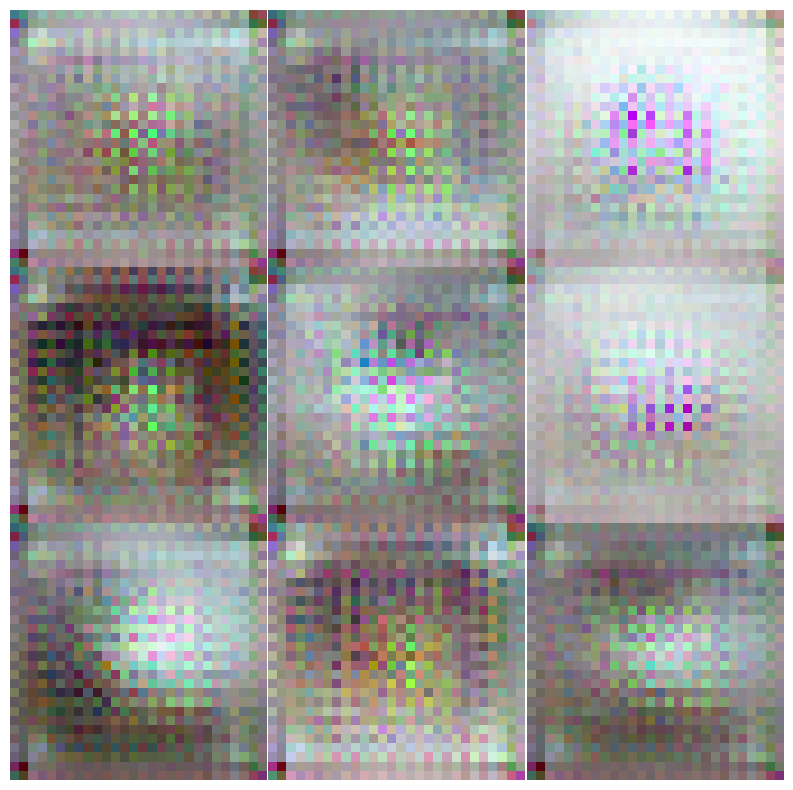

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


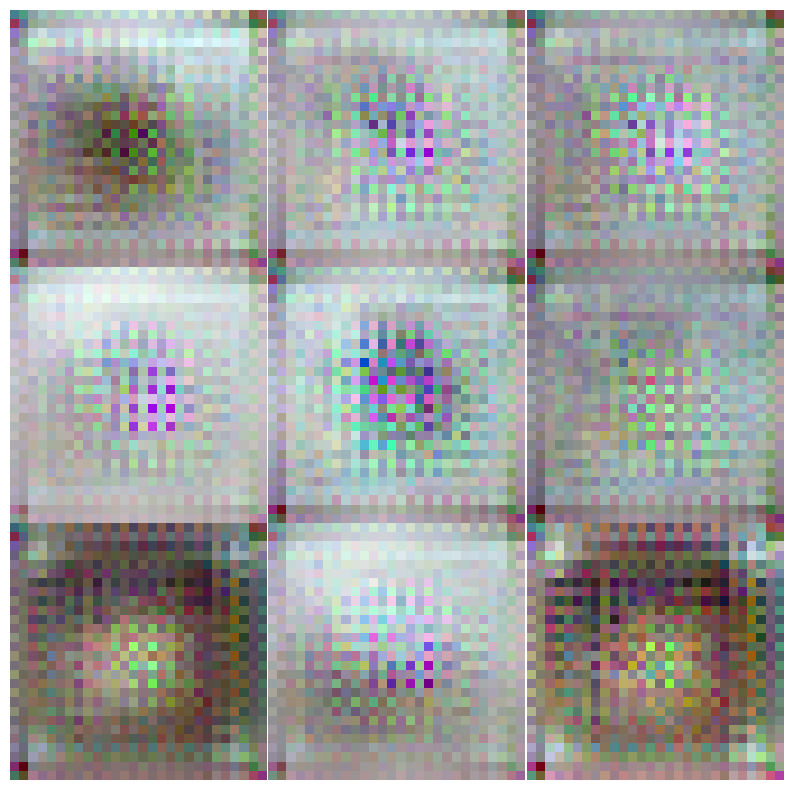

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


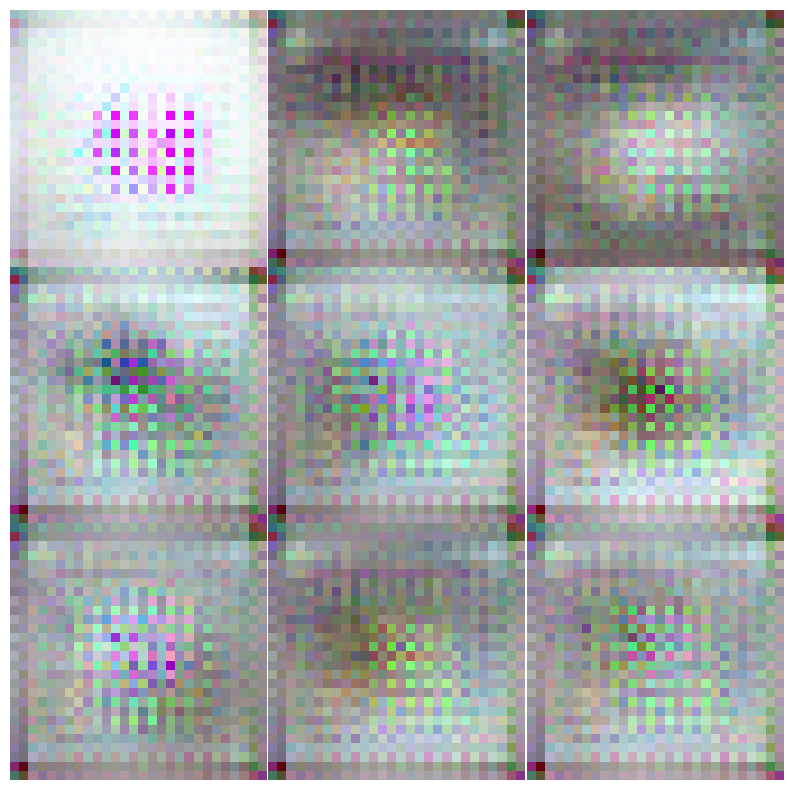

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


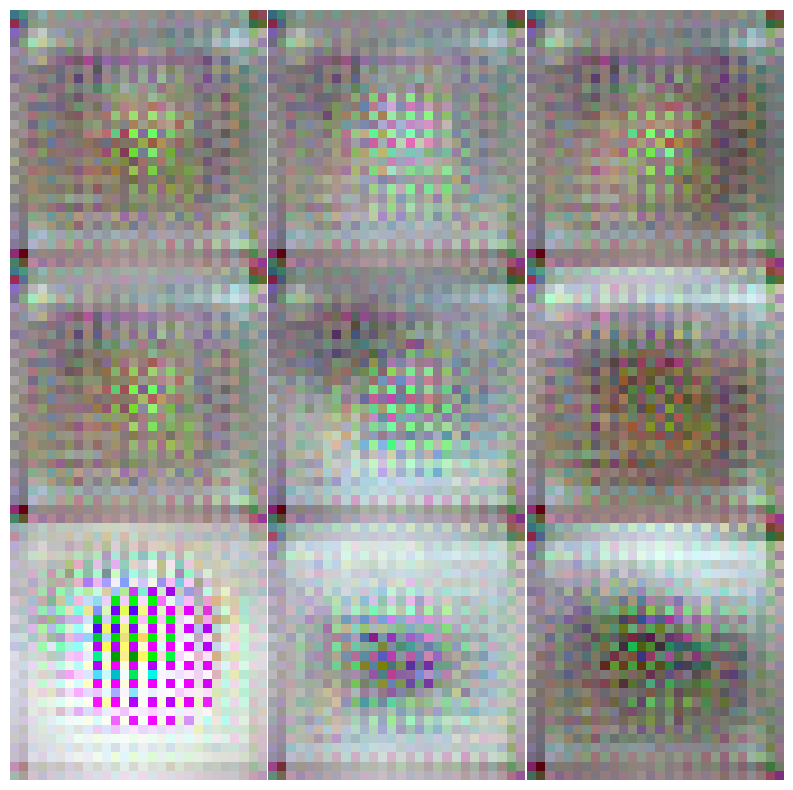

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


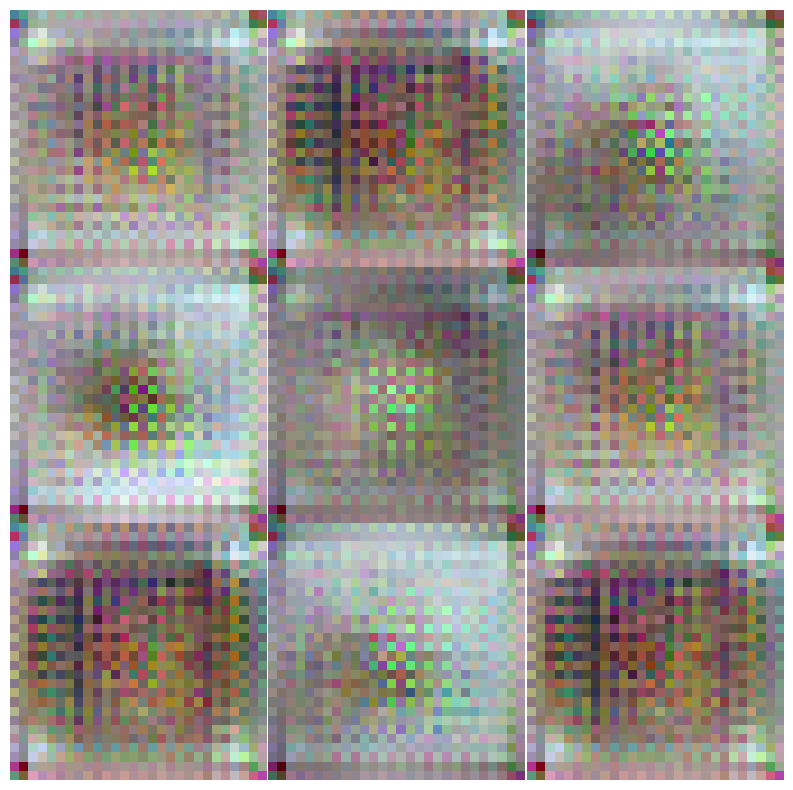

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


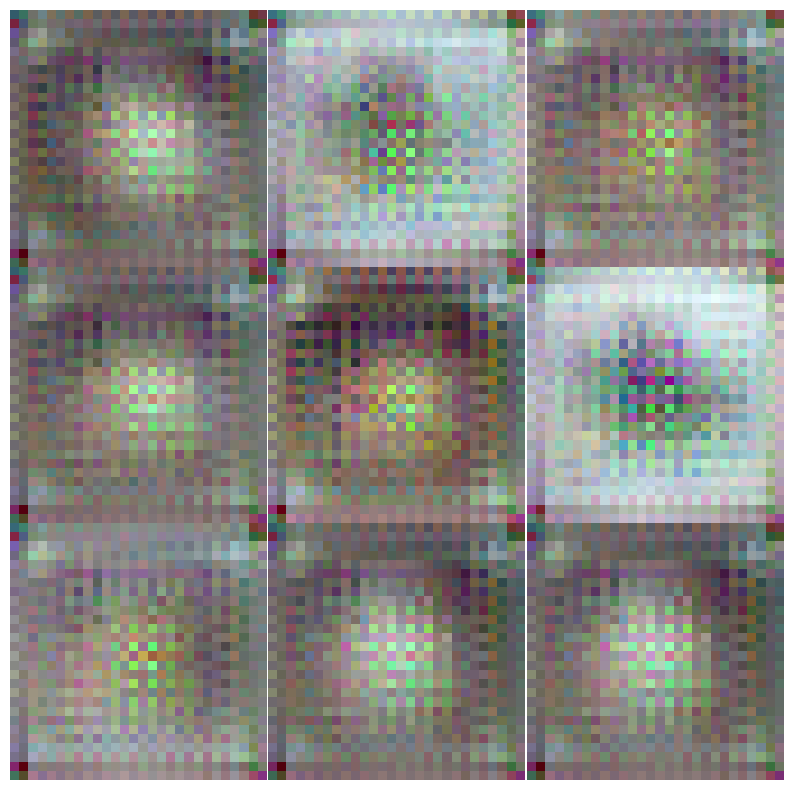

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


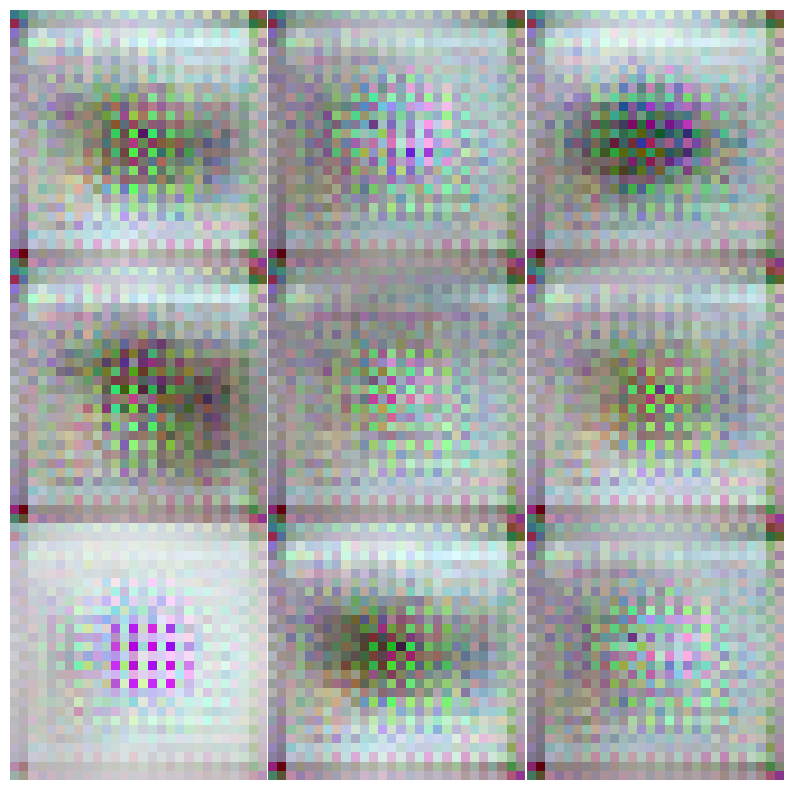

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


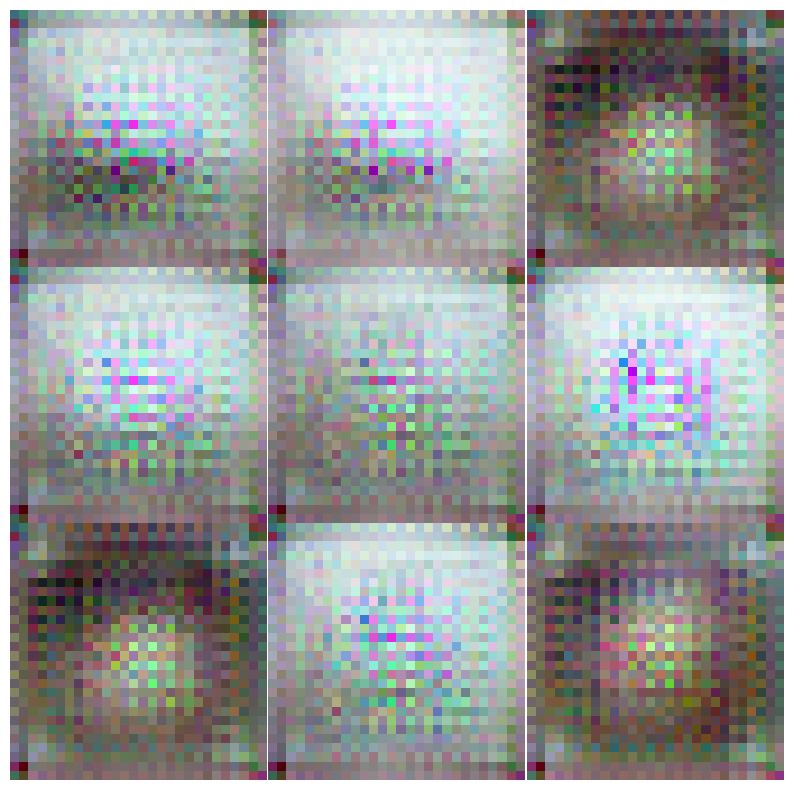

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


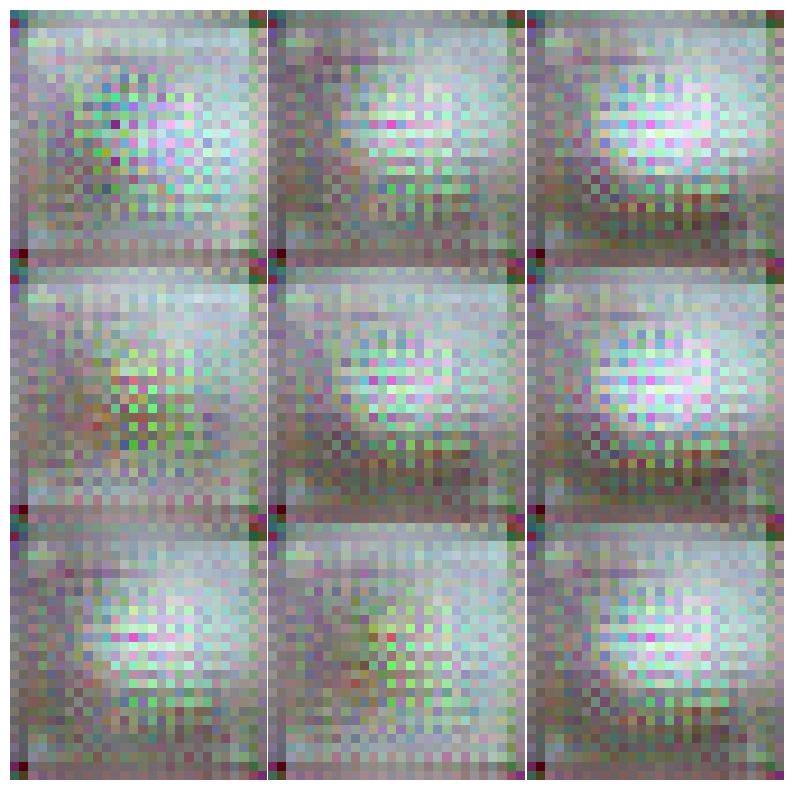

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 1.23
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({np.float64(1.0): 3000, np.float64(2.0): 3000, np.float64(3.0): 3000, np.float64(4.0): 3000, np.float64(5.0): 3000, np.float64(6.0): 3000, np.float64(7.0): 3000, np.float64(8.0): 3000, np.float64(9.0): 3000, np.float64(0.0): 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.309302
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.307377
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.296312
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.289629
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.290292
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.290980
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.277380
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.250048
Train Epoch: 1 [9000/30000 (30%)]	Loss: 2.221198
Train Epoch: 1 [10000/30000 (33%)]	Loss: 2.196851
Train Epoch: 1 [11000/30000 (37%)]	Loss: 2.108552
Train Epoch: 1 [12000/30000 (40%)]	Loss: 2.048777
Train Epoch: 1 [13000/30000 (43%)]	Loss: 2.059925
Trai

Loading...:  22%|██▏       | 16/73 [00:25<01:32,  1.62s/it]


KeyboardInterrupt: 

In [ ]:
args['epochs'] = 200 # how many epochs to run for (original used 200)

trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

# initial hyperparams
alpha_start = 0.95   # mostly MSE early
alpha_end   = 0.5    # balance later
tau_start   = 0.25   # soft early
tau_end     = 0.15   # sharper later
num_epochs  = 300    # example

def get_schedules(epoch):
    # linear scheduling
    alpha = alpha_start - (alpha_start - alpha_end) * (epoch / num_epochs)
    tau   = tau_start  - (tau_start  - tau_end)   * (epoch / num_epochs)
    return alpha, tau

temperature = 0.1      # SupCon temperature
alpha = 0.5

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)
    

    criterion2 = NTXentLoss(temperature=temperature).to(device)
    #criterion2 = SupConLoss().to(device)
    
    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0

            encoder.train()
            decoder.train()
            
            epoch_mse = 0.0
            epoch_contrast = 0.0
            #alpha = 1 - min(0.5, epoch / 200)             # weight for MSE vs contrastive loss (1-alpha)
            #alpha, tau = get_schedules(epoch)  # get schedules for alpha and tau
            #print(f"Alpha={alpha:.4f}, tau={tau:.4f}")
            
            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                images, labs = images.to(device), labs.to(device)
                labsn = labs.detach().cpu().numpy()

                # run images
                z_hat,class_hat = encoder(images,labsn)
                
                # sort z_hat and class_hat by labels
                sort_z_hat = [[] for _ in range(args['num_class'])]
                for i, label in enumerate(labsn):
                    sort_z_hat[label].append(z_hat[i].cpu().detach().numpy())

                # Check if sort_z_hat is empty
                z_hat_to_concat = []
                for tensor in sort_z_hat:
                    if len(tensor) != 0:
                        z_hat_to_concat.append(torch.tensor(tensor).to(device))
                        
                if z_hat_to_concat:
                    combined_z_hat = torch.cat(z_hat_to_concat, dim=0)
                    #print('combined_z_hat',combined_z_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_z_hat = torch.zeros((1, args['n_z'])).to(device)

                # Check if class_hat is empty
                class_hat_to_concat = []
                for tensor in class_hat:
                    if len(tensor) != 0:
                        class_hat_to_concat.append(tensor)
                if class_hat_to_concat:
                    combined_class_hat = torch.cat(class_hat_to_concat, dim=0)
                    #print('combined_class_hat',combined_class_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_class_hat = torch.zeros((1, args['n_z'])).to(device)

                # Combine the views using torch.stack()
                # `dim=1` places the new "views" dimension at the second position.
                
                # *Option* L2 normalization
                combined_z_hat = F.normalize(combined_z_hat, dim=1)
                combined_class_hat = F.normalize(combined_class_hat, dim=1)
                
                features = torch.stack([combined_z_hat, combined_class_hat], dim=1)
                # The new shape of the 'features' tensor is [100, 2, 300]
                #print(features.shape)
                
                mse2 = criterion2(combined_z_hat, combined_class_hat)
                
                
                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                # --- MSE loss ---
                mse = criterion(x_hat, images)
     
                # --- Combined loss ---
                comb_loss = alpha * mse + (1 - alpha) * mse2
                comb_loss.backward()
                
                # --- Step optimizers ---
                enc_optim.step()
                dec_optim.step()
                
                # accumulate for logging
                epoch_mse += mse.item() * images.size(0)
                epoch_contrast += mse2.item() * images.size(0)         

            # --- Log epoch losses ---
            avg_mse = epoch_mse / len(train_loader.dataset)
            avg_contrast = epoch_contrast / len(train_loader.dataset)
            avg_comb = avg_mse * alpha + avg_contrast * (1-alpha)
            print(f"Epoch {epoch}: MSE: {avg_mse:.4f}, Contrastive: {avg_contrast:.4f}, Combined: {avg_comb:.4f}")
            trainingDataset_loss.append(train_loss)
            
        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    import numpy as np
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    print('------ Plot Latent Space ------')
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    print('------------------------------')
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    import time
    import os
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) 
            print('class',yclass[0]) 
    
            #encode xclass to feature space
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) 

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    from sklearn.manifold import TSNE
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    # Load the training images and labels
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    print('------ Plot Balanced Imgs ------')

    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(dec_x)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    fig.show()
    
    print('------------------------------')

    #  IMPORT BALANCED IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    ###########################  TRAIN CNN  ####################################################
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    #set hyperparameters
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    ########################### TEST CNN ####################################################
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))

### Avg via folders

In [ ]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

## Traning - Gen - Evalution (L2)

In [ ]:
args['epochs'] = 200
trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)

    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0
            # train for one epoch -- set nets to train mode
            encoder.train()
            decoder.train()

            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                #print(images)
                images, labs = images.to(device), labs.to(device)
                #print('images ',images.shape)
                labsn = labs.detach().cpu().numpy()
                #print('labsn ',labsn.shape, labsn)


                num_clss_in_bag = np.unique(labsn) #return_inverse=True)
                train_list = [[] for _ in range(args['num_class'])]

                # run images
                z_hat,x0_hat = encoder(images,labsn)

                # Class images Bagging from z_hat
                for i, label in enumerate(labsn):
                  train_list[int(label)].append(z_hat[i])

                loss_list = [[] for _ in range(args['num_class'])]
                for j in num_clss_in_bag:
 
                  size = x0_hat[j].size()
                  test_x0 = torch.stack(train_list[j]).to(device)
                  test_x0 = test_x0.detach().cpu().numpy()  # Convert to NumPy array after detaching
                  test_x0 = np.resize(test_x0, size)
                  test_x0 = torch.from_numpy(test_x0).to(device)

                  mse2 = criterion(x0_hat[j],test_x0)

                  loss_list[j] = mse2

                # Convert empty lists to zero tensors to allow summation
                loss_list = [torch.tensor(0.0).to(device) if not l else l for l in loss_list ]

                #sys.exit(1)

                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                mse = criterion(x_hat,images)



                total_sums = calculate_diffs(x0_hat)
                total_sums_array = np.array(total_sums)
                total_sums_array[total_sums_array == 0] = 0  # This line ensures 0 values stay as 0
                #print(total_sums_array)
                mse3 = np.zeros_like( total_sums_array, dtype = float)
                nonzero_indices = np.where( total_sums_array != 0)
                mse3[nonzero_indices] = 1/total_sums_array[nonzero_indices]

                comb_loss = mse + sum(loss_list) + sum(mse3)
                comb_loss.backward()

                enc_optim.step()
                dec_optim.step()

                train_loss += comb_loss.item()*images.size(0)
                tmse_loss += mse.item()*images.size(0)


            # print avg training statistics
            train_loss = train_loss/len(train_loader)
            tmse_loss = tmse_loss/len(train_loader)
            tdiscr_loss = 0 #tdiscr_loss/len(train_loader)
            print('Epoch: {} \tTrain Loss: {:.6f} \tmse loss: {:.6f} \tmse2 loss: {:.6f}'.format(epoch,
                    train_loss,tmse_loss,tdiscr_loss))
            trainingDataset_loss.append(train_loss)

        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    from sklearn.decomposition import PCA
    import numpy as np
    import pandas as pd
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    from sklearn.neighbors import NearestNeighbors
    import time
    import os
    import sys
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) #(500, 3, 32, 32)
            print('class',yclass[0]) #(500,)
    
            #encode xclass to feature space
            #xclass = torch.Tensor(xclass)
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) #torch.Size([500, 600])

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    from sklearn.manifold import TSNE
    #tsne = TSNE(n_components=2, random_state=42)
    #X_tsne = tsne.fit_transform(dec_x)
    #fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    #fig.show()

    #  IMPORT BL IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    #  TRAIN CNN
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    #set hyperparameter
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    #  TEST CNN
    # prompt: measure ACSA, GM, and FM from imbalanced_test_loader
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))


Start...
cpu


Loading...: 100%|██████████| 73/73 [01:39<00:00,  1.37s/it]


Epoch: 0 	Train Loss: 11.334388 	mse loss: 11.245123 	mse2 loss: 0.000000


Loading...:  36%|███▌      | 26/73 [00:41<01:15,  1.61s/it]


KeyboardInterrupt: 

### Avg via folders

In [ ]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

# Terminal